# Cases vs Mobility

Inspecting the relationship between various mobility metrics and case growth

Daily mobility metrics of interest:

- total trips
- total trips between parishes
- trips by parish residents
    - e.g. did trips by residents from more infectious regions like La Masana have greater correlation with case growth?
- users making trips
- users making trips between parishes
- rate at which  people are staying at home
- country entrances    

- avg trips per user vs 99th and 90th percentile trips per user

Compare to reported growth in cases.

In [47]:
from datetime import datetime, timedelta
import pathlib

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import numpy as np
import pandas as pd


IMSI = 'imsi'
MCC ='mcc'
DATE = 'date'

ENTRANCES = 'entrances'


date_fmt = '%Y-%m-%d'

PRIVATE_DATA_FPATH = '../data/private'
PUBLIC_DATA_FPATH = '../data/public'
METRICS_FPATH = '../outputs/metrics/2020'

# New cases

We use publicly available  data  (OWID).


In [6]:
cases_datapath = PUBLIC_DATA_FPATH + '/cases/owid-covid-data.csv'

NEW_CASES = 'new_cases'
TOTAL_CASES = 'total_cases'
NEW_DEATHS = 'new_deaths'
TOTAL_DEATHS = 'total_deaths'
# downloaded OWID  data also has smoothed cases field but they don't acount for our data corrections
NEW_CASES_SMOOTHED_7D = 'new cases (7 day average)'
NEW_CASES_SMOOTHED_14D = 'new cases (14 day average)'
TOTAL_CASES_SMOOTHED_14D = 'cumulative cases (14 day average)'

In [7]:
cases=pd.read_csv(cases_datapath).set_index(DATE)
# restrict to Andorra data with only the fields we need
cases=cases.loc[cases['location']=='Andorra'][[NEW_CASES, TOTAL_CASES, NEW_DEATHS, TOTAL_DEATHS]]
# fixup dates
cases=cases.loc[~cases[NEW_CASES].isnull()]
cases.index=pd.to_datetime(cases.index, format='%Y/%m/%d')
cases_start_date = '2020-03-01'
cases_end_date = cases.index[-1]
print('using cases start date', cases_start_date)
print('using cases end date', cases_end_date)
all_dates = pd.date_range(pd.to_datetime(cases_start_date, format=date_fmt), cases_end_date)
cases=cases.reindex(all_dates)
cases = cases.reindex(cases.index.rename(DATE))
cases.head()

using cases start date 2020-03-01
using cases end date 2021-04-22 00:00:00


,new_cases,total_cases,new_deaths,total_deaths
date,,,,
2020-03-01,NaN,NaN,NaN,NaN
2020-03-02,1.0,1.0,NaN,NaN
2020-03-03,0.0,1.0,NaN,NaN
2020-03-04,0.0,1.0,NaN,NaN
2020-03-05,0.0,1.0,NaN,NaN


Fix up data.

Remove additional cases in June 3rd: would not have been identified without the serology testing.

Smooth the data over rolling window of 7 days.

In [943]:
cases.loc['2020-06-03', NEW_CASES]=1
cases = cases.fillna(0)
cases[TOTAL_CASES]=cases[NEW_CASES].cumsum()
cases[TOTAL_DEATHS]=cases[NEW_DEATHS].cumsum()
cases[NEW_CASES_SMOOTHED_7D] = cases[NEW_CASES].rolling(window=7, center=True, min_periods=1).mean()
cases[NEW_CASES_SMOOTHED_14D] = cases[NEW_CASES].rolling(window=14, center=True, min_periods=1).mean()
cases[TOTAL_CASES_SMOOTHED_14D] = cases[TOTAL_CASES].rolling(window=14, center=True, min_periods=1).mean()
cases.head()

,new_cases,total_cases,new_deaths,total_deaths,new cases (7 day average),new cases (14 day average),cumulative cases (14 day average)
date,,,,,,,
2020-03-01,0.0,0.0,0.0,0.0,0.250000,0.142857,0.714286
2020-03-02,0.0,0.0,0.0,0.0,0.200000,0.125000,0.750000
2020-03-03,1.0,1.0,0.0,0.0,0.166667,0.111111,0.777778
2020-03-04,0.0,1.0,0.0,0.0,0.142857,0.100000,0.800000
2020-03-05,0.0,1.0,0.0,0.0,0.142857,0.090909,0.818182


### Plot it

In [43]:
# Set up consistent colors / plotting pallete

c_deaths = 'red'
c_new_cases = 'maroon'
c_cc = 'blueviolet'
c_population_present = 'green'
c_mobility = c_population_present
c_susceptible_fraction_population = 'blue'

c_lcg = 'orange'

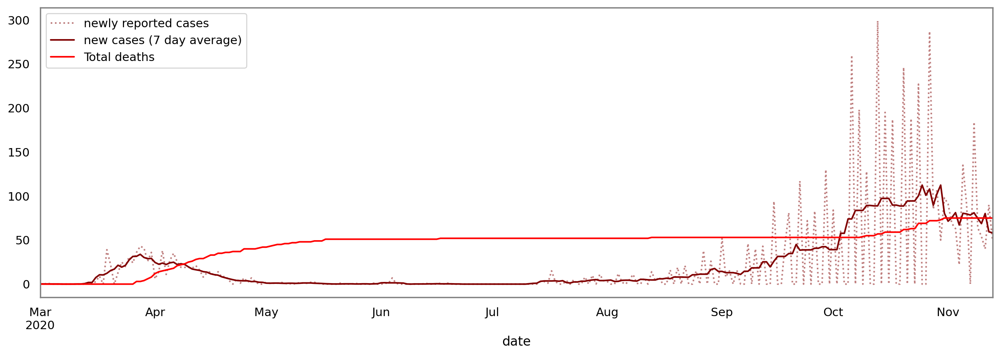

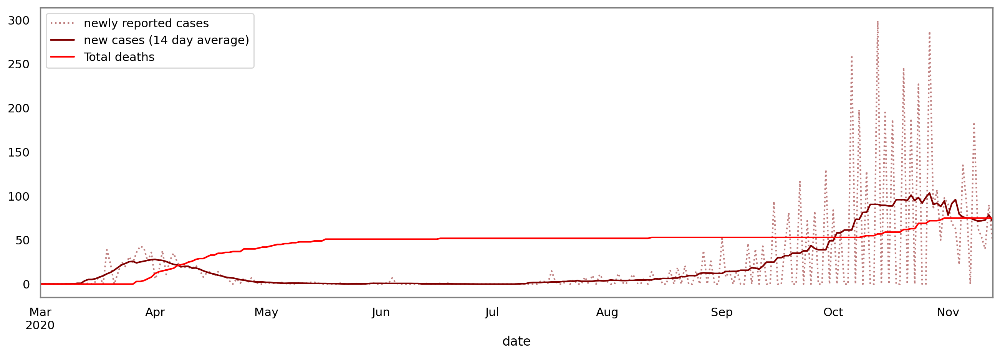

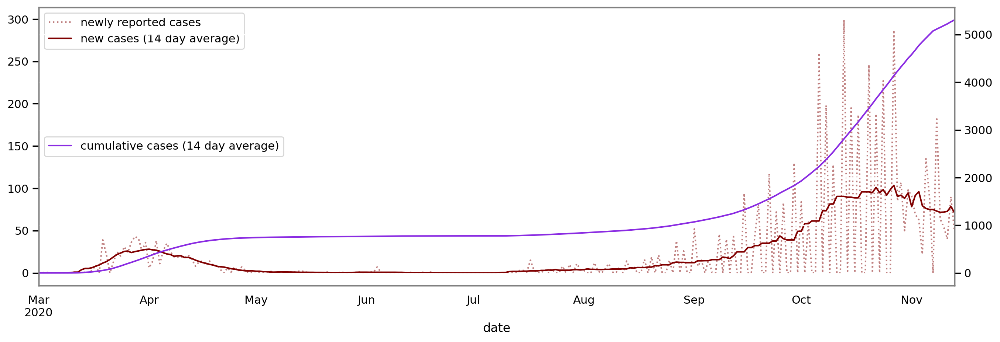

In [945]:
fig, ax= plt.subplots(1, figsize=(16, 5), dpi=100)
cases[NEW_CASES].plot(legend=True, ax=ax, color=c_new_cases, alpha=0.5, linestyle='dotted', label='newly reported cases')
cases[NEW_CASES_SMOOTHED_7D].plot(legend=True, ax=ax, color=c_new_cases)
cases[TOTAL_DEATHS].plot(legend=True,ax=ax, color=c_deaths, label='Total deaths')

fig, ax= plt.subplots(1, figsize=(16, 5), dpi=100)
cases[NEW_CASES].plot(legend=True, ax=ax, color=c_new_cases, alpha=0.5, linestyle='dotted', label='newly reported cases')
cases[NEW_CASES_SMOOTHED_14D].plot(legend=True, ax=ax, color=c_new_cases)
cases[TOTAL_DEATHS].plot(legend=True,ax=ax, color=c_deaths, label='Total deaths')

fig, ax= plt.subplots(1, figsize=(16, 5), dpi=100)
cum_cases_ax = ax.twinx()
cases[NEW_CASES].plot(legend=True, ax=ax, color=c_new_cases, alpha=0.5, linestyle='dotted', label='newly reported cases')
cases[NEW_CASES_SMOOTHED_14D].plot(legend=True, ax=ax, color=c_new_cases)
cases[TOTAL_CASES_SMOOTHED_14D].plot(legend=True,ax=cum_cases_ax, color=c_cc)
ax.legend(loc='upper left')
cum_cases_ax.legend(loc='center left')

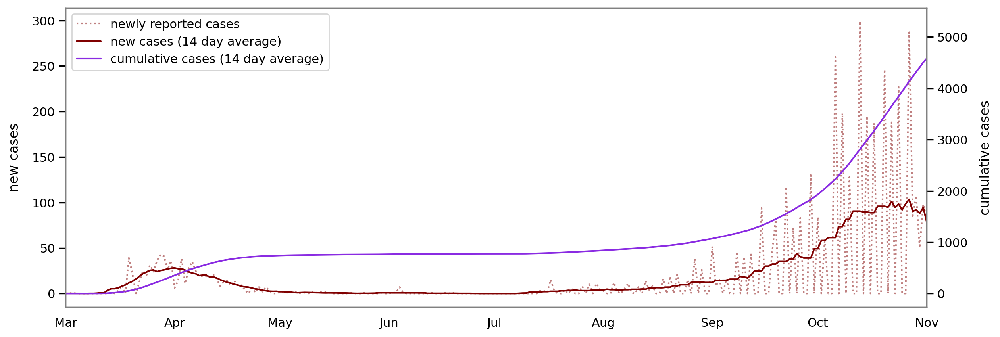

In [947]:
myFmt = mdates.DateFormatter('%b')
fig, ax= plt.subplots(1, figsize=(14, 5), dpi=100)
cc_ax = ax.twinx()
lns = []
lns += ax.plot(cases[NEW_CASES], color=c_new_cases, alpha=0.5, linestyle='dotted', label='newly reported cases')
lns += ax.plot(cases[NEW_CASES_SMOOTHED_14D], color=c_new_cases, label=NEW_CASES_SMOOTHED_14D)
lns += cc_ax.plot(cases[TOTAL_CASES_SMOOTHED_14D], color=c_cc, label=TOTAL_CASES_SMOOTHED_14D)

ax.set_xlim(datetime(2020,3,1,0,0), datetime(2020,11,1,0,0))
ax.set_ylabel('new cases', labelpad=10)
cc_ax.set_ylabel('cumulative cases', labelpad=10)
labels = [l.get_label() for l in lns]
ax.xaxis.set_major_formatter(myFmt)
ax.legend(lns, labels, loc='upper left')
ax.grid(False)
cc_ax.grid(False)

The daily number of newly reported cases is does not account for reporting rate or the change in the size of the susceptible population.
The susceptible population changes as people enter/leave the country as well as get sick. 

We estimate transmission rate and log growth in daily cases with the following naive approach:

rho = 1/11 : reporting rate (constant)

n(t) : population on day t

c(t) : newly reported cases on day t, averaged over a 14 day rolling window

c^bar(t) : cumulative reported cases on day t, averaged over a 14 day rolling window

s(t) = n(t) - 1/rho * c^bar(t)) : susceptible population on day t

S(t)= s(t)/n(t) = (n(t) - rho * c^bar(t))/n(t) : susceptible fraction of the population on day t

C(t) = (1/rho * c(t)) / S(t) : susceptible-normalised new cases


The analysis uses the log of the growth in daily new cases (LCG), estimated as the relative change in the susceptible-normalised new cases since the 14 days prior (equation Z).

LCG(t) = log(C(t) / C(t-14)) = log(C(t)) - log(C(t-14))



Assumptions used in estimate (be wary):
- past cumulative reported cases can be counted as 'recovered (R)' people.
- recovered COVID cases do not leave the country
- the reporting rate  remains unchanged


### Estimating population present

In [8]:
USERS_PRESENT = 'users present'
ENTRANCES = 'entrances'


def get_homes_filepath(year, month):
    return '{}homes/{}_{}_homes.csv'.format(PRIVATE_DATA_FPATH, year, month)

def get_stays_filepath(day, month, year):
    return '{}stays/{}_{}/stays_{}_{}_{}.csv'.format(PRIVATE_DATA_FPATH, year, month, year, month, day)

def daterange(start_datetime, end_datetime):
    for n in range(int((end_datetime - start_datetime).days) + 1):
        yield start_datetime + timedelta(n)
        

start_date_2020 = '2020-02-01'
end_date_2020 = '2020-10-31'

datetimes = [d for d in daterange(datetime.strptime(start_date_2020, date_fmt), 
                                   datetime.strptime(end_date_2020, date_fmt))]
datetimes

[datetime.datetime(2020, 2, 1, 0, 0),
 datetime.datetime(2020, 2, 2, 0, 0),
 datetime.datetime(2020, 2, 3, 0, 0),
 datetime.datetime(2020, 2, 4, 0, 0),
 datetime.datetime(2020, 2, 5, 0, 0),
 datetime.datetime(2020, 2, 6, 0, 0),
 datetime.datetime(2020, 2, 7, 0, 0),
 datetime.datetime(2020, 2, 8, 0, 0),
 datetime.datetime(2020, 2, 9, 0, 0),
 datetime.datetime(2020, 2, 10, 0, 0),
 datetime.datetime(2020, 2, 11, 0, 0),
 datetime.datetime(2020, 2, 12, 0, 0),
 datetime.datetime(2020, 2, 13, 0, 0),
 datetime.datetime(2020, 2, 14, 0, 0),
 datetime.datetime(2020, 2, 15, 0, 0),
 datetime.datetime(2020, 2, 16, 0, 0),
 datetime.datetime(2020, 2, 17, 0, 0),
 datetime.datetime(2020, 2, 18, 0, 0),
 datetime.datetime(2020, 2, 19, 0, 0),
 datetime.datetime(2020, 2, 20, 0, 0),
 datetime.datetime(2020, 2, 21, 0, 0),
 datetime.datetime(2020, 2, 22, 0, 0),
 datetime.datetime(2020, 2, 23, 0, 0),
 datetime.datetime(2020, 2, 24, 0, 0),
 datetime.datetime(2020, 2, 25, 0, 0),
 datetime.datetime(2020, 2, 26, 0,

## Use precomputed presence and entrances data

In [23]:
presence_data_fpath = METRICS_FPATH + '/presence.csv'
entrance_departure_data_fpath = METRICS_FPATH + '/entrance_departure.csv'

In [22]:
presence_df = pd.read_csv(presence_data_fpath).set_index(DATE)
presence_df.head()

,tourists,non-tourists,all
date,,,
2020-01-01,205002,66110,271112
2020-01-02,190105,66000,256105
2020-01-03,168056,65859,233915
2020-01-04,147674,65671,213345
2020-01-05,124287,65476,189763


In [26]:
entrances_departures_df = pd.read_csv(entrance_departure_data_fpath).rename(columns={'Unnamed: 0': DATE}).set_index(DATE)
entrances_departures_df.head(3)

,entrance_Andorran,entrance_Spanish,entrance_French,entrance_British,entrance_Other,departures_Andorran,departures_Spanish,departures_French,departures_British,departures_Other
date,,,,,,,,,,
2020-01-01,0,0,0,0,0,255,9104,3114,400,2134
2020-01-02,0,0,0,0,0,353,11011,7293,574,2959
2020-01-03,0,0,0,0,0,365,11053,5471,678,3003


Make aggregated presence dataframe
```
date, users present, entrances
```

In [34]:
presence_df = presence_df.drop(
    ['tourists','non-tourists'],
    axis=1
).rename(columns={'all':'users present'})
presence_df.head()

,users present,entrances
date,,
2020-01-01,271112,0
2020-01-02,256105,0
2020-01-03,233915,0
2020-01-04,213345,0
2020-01-05,189763,0


In [35]:
entrance_departure_cols = list(entrances_departures_df.columns)
entrance_cols = [c for c in entrance_departure_cols if c.startswith('entrance')]
departure_cols = [c for c in entrance_departure_cols if c.startswith('departure')]
assert(len(entrance_cols)+len(departure_cols)==len(entrances_departures_df.columns))
presence_df[ENTRANCES] = entrances_departures_df[entrance_cols].sum(axis=1)
presence_df.head()

,users present,entrances
date,,
2020-01-01,271112,0
2020-01-02,256105,0
2020-01-03,233915,0
2020-01-04,213345,0
2020-01-05,189763,0


In [39]:
presence_df.index = pd.to_datetime(presence_df.index)

In [40]:
missing_dates = [
datetime(2020, 2, 14, 0, 0),
datetime(2020, 2, 15, 0, 0),
datetime(2020, 2, 16, 0, 0),
datetime(2020, 2, 17, 0, 0),
datetime(2020, 2, 18, 0, 0),
datetime(2020, 2, 19, 0, 0),
datetime(2020, 2, 20, 0, 0),
datetime(2020, 2, 21, 0, 0),
datetime(2020, 2, 22, 0, 0),
datetime(2020, 2, 23, 0, 0),
datetime(2020, 2, 24, 0, 0),
datetime(2020, 2, 25, 0, 0),
datetime(2020, 2, 26, 0, 0),
datetime(2020, 2, 27, 0, 0),
datetime(2020, 2, 28, 0, 0),
datetime(2020, 2, 29, 0, 0),
datetime(2020, 3, 1, 0, 0),
datetime(2020, 6, 28, 0, 0),
datetime(2020, 6, 29, 0, 0),
datetime(2020, 7, 21, 0, 0),
datetime(2020, 7, 22, 0, 0),
datetime(2020, 7, 23, 0, 0),
datetime(2020, 7, 24, 0, 0),
datetime(2020, 7, 25, 0, 0),
datetime(2020, 7, 26, 0, 0),
datetime(2020, 7, 27, 0, 0),
datetime(2020, 10, 1, 0, 0),
datetime(2020, 10, 2, 0, 0),
datetime(2020, 10, 3, 0, 0),
datetime(2020, 10, 4, 0, 0),
datetime(2020, 10, 5, 0, 0),
datetime(2020, 10, 6, 0, 0)]
presence_df.loc[missing_dates,:] = np.NaN

In [41]:
# The intersection of dates for which we have/use both cases and mobility data
study_datetimes = [d for d in presence_df.index if d in cases.index]
study_datetimes

[Timestamp('2020-03-01 00:00:00'),
 Timestamp('2020-03-02 00:00:00'),
 Timestamp('2020-03-03 00:00:00'),
 Timestamp('2020-03-04 00:00:00'),
 Timestamp('2020-03-05 00:00:00'),
 Timestamp('2020-03-06 00:00:00'),
 Timestamp('2020-03-07 00:00:00'),
 Timestamp('2020-03-08 00:00:00'),
 Timestamp('2020-03-09 00:00:00'),
 Timestamp('2020-03-10 00:00:00'),
 Timestamp('2020-03-11 00:00:00'),
 Timestamp('2020-03-12 00:00:00'),
 Timestamp('2020-03-13 00:00:00'),
 Timestamp('2020-03-14 00:00:00'),
 Timestamp('2020-03-15 00:00:00'),
 Timestamp('2020-03-16 00:00:00'),
 Timestamp('2020-03-17 00:00:00'),
 Timestamp('2020-03-18 00:00:00'),
 Timestamp('2020-03-19 00:00:00'),
 Timestamp('2020-03-20 00:00:00'),
 Timestamp('2020-03-21 00:00:00'),
 Timestamp('2020-03-22 00:00:00'),
 Timestamp('2020-03-23 00:00:00'),
 Timestamp('2020-03-24 00:00:00'),
 Timestamp('2020-03-25 00:00:00'),
 Timestamp('2020-03-26 00:00:00'),
 Timestamp('2020-03-27 00:00:00'),
 Timestamp('2020-03-28 00:00:00'),
 Timestamp('2020-03-

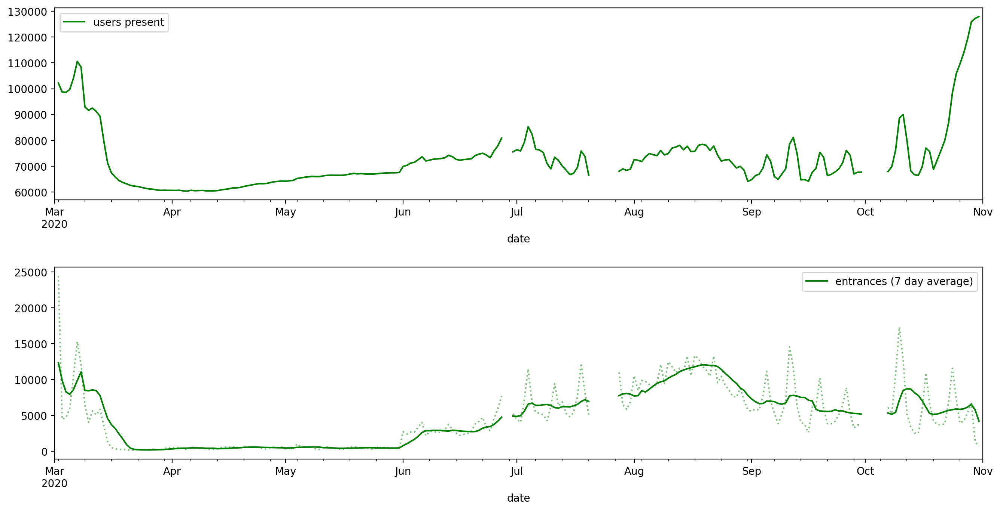

In [44]:
fig, ax= plt.subplots(2, figsize=(16, 8), dpi=100,)
plt.subplots_adjust(hspace=0.35)
presence_df[USERS_PRESENT].reindex(study_datetimes).plot(legend=True, ax=ax[0], color=c_population_present)
presence_df[ENTRANCES].reindex(study_datetimes).plot(
    ax=ax[1], color=c_mobility, alpha=0.5, linestyle='dotted')
presence_df.dropna()[ENTRANCES].rolling(7, min_periods=1).mean().reindex(study_datetimes).plot(
    legend=True, ax=ax[1], color=c_mobility, label='entrances (7 day average)')
for axis in ax:
    axis.set_xlim(study_datetimes[0], datetime(2020, 11, 1, 0, 0))

## Estimate growth in cases over suscpeptible population

rho = 1/11 : reporting rate (constant)

n(t) : population on day t

c(t) : newly reported cases on day t, averaged over a 14 day rolling window

c^bar(t) : cumulative reported cases on day t, averaged over a 14 day rolling window

s(t) = n(t) - 1/rho * c^bar(t)) : susceptible population on day t

S(t)= s(t)/n(t) = (n(t) - rho * c^bar(t))/n(t) : susceptible fraction of the population on day t

C(t) = (1/rho * c(t)) / S(t) : susceptible-normalised new cases

The analysis uses the log of the growth in daily new cases (LCG), estimated as the relative change in the susceptible-normalised new cases since the 14 days prior (equation Z).

LCG(t) = log(C(t) / C(t-14)) = log(C(t)) - log(C(t-14))

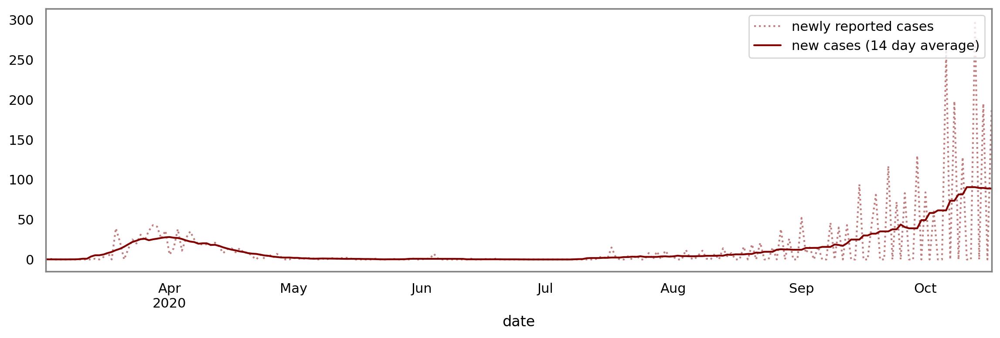

In [897]:
fig, ax= plt.subplots(1, figsize=(14, 4), dpi=100)
cases[NEW_CASES].reindex(study_index).plot(legend=True, ax=ax, color=c_new_cases, alpha=0.5, linestyle='dotted', label='newly reported cases')
cases[NEW_CASES_SMOOTHED_14D].reindex(study_index).plot(legend=True, ax=ax, color=c_new_cases)
ax.set_xlim(study_index[0], study_index[-1])
ax.legend(loc='upper right')
ax.grid(False)
plt.show()

In [855]:
reporting_rate = 1/11
s = presence_df[USERS_PRESENT] - (1/reporting_rate)*cases[TOTAL_CASES_SMOOTHED_14D]
cases['S'] = s/presence_df[USERS_PRESENT]

Define date range from which to plot / analyze.

The presence data was computed with a window of 14 days. This could disturb metrics 14 days from their endpoints.

In [432]:
# mobility data for March starts '2020-03-02'
# mobiity data available ends '2020-10-31'

study_period_start_d,study_period_end_d = '2020-03-02', '2020-10-17'
study_index = cases.loc[study_period_start_d:study_period_end_d].index

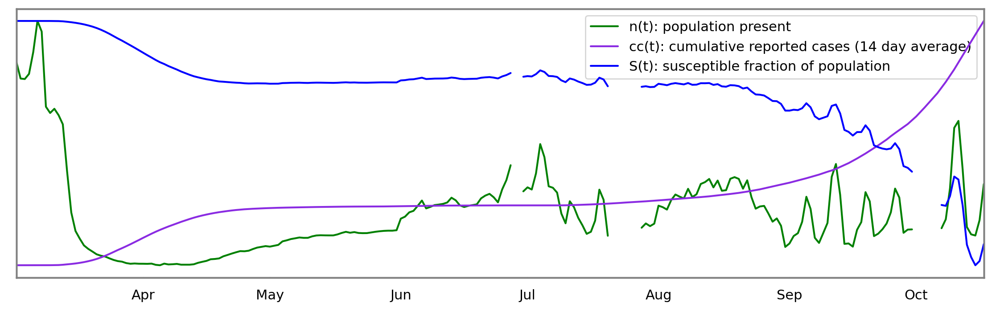

In [896]:

fig, ax0 = plt.subplots(1, figsize=(14, 4), dpi=100)
ax1 = ax0.twinx()
ax2 = ax0.twinx()
l0=ax0.plot(study_index, presence_df[USERS_PRESENT].reindex(study_index),
             color=c_population_present, label='n(t): population present')
l1=ax1.plot(study_index, cases[TOTAL_CASES_SMOOTHED_14D].reindex(study_index),
             color=c_cc, label='cc(t): cumulative reported cases (14 day average)')
l2=ax2.plot(study_index, cases['S'].reindex(study_index),
             color=c_susceptible_fraction_population, 
            label='S(t): susceptible fraction of population')
lns = l0+l1+l2
labels = [l.get_label() for l in lns]
ax0.legend(lns, labels, loc='upper right')

myFmt = mdates.DateFormatter('%b')
for ax in [ax0,ax1,ax2]:
    ax.set_xlim(study_index[0], study_index[-1])
    ax.xaxis.set_major_formatter(myFmt)
    ax.set_yticks([])

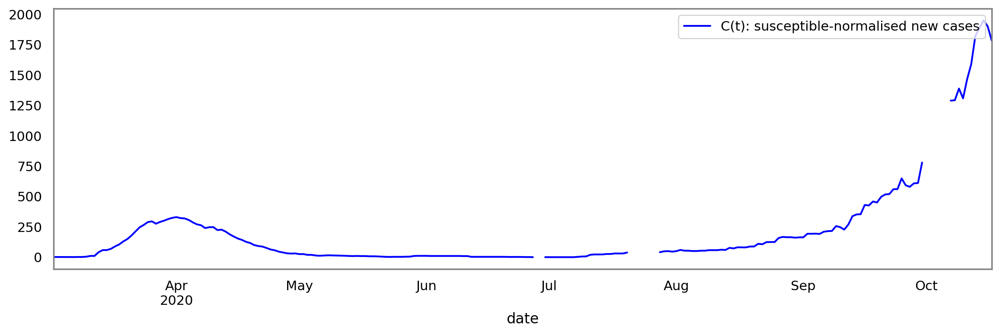

In [894]:
# The susceptible-normalised new cases per day (C) were then estimated as:
# C(t) = (1/rho * c(t)) / S(t)
C_label = 'C(t): susceptible-normalised new cases'
cases['C'] = (1/reporting_rate)*cases[NEW_CASES_SMOOTHED_14D]/cases['S']

fig, ax= plt.subplots(1, figsize=(14, 4), dpi=100)
cases['C'].reindex(study_index).plot(legend=True,ax=ax, 
                                     color=c_susceptible_fraction_population,label=C_label)
ax.set_xlim(study_index[0], study_index[-1])
ax.legend(loc='upper right')
ax.grid(False)
plt.show()

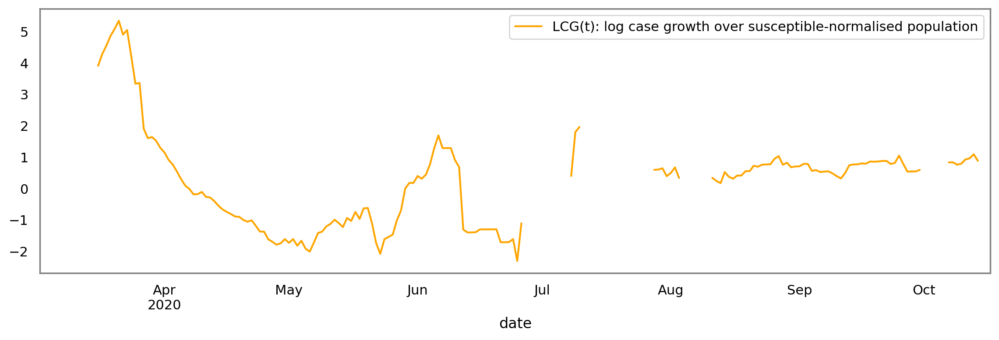

In [895]:
# LCG(t) = log(C(t) / C(t-14)) = log(C(t)) - log(C(t-14))
LCG_label = 'LCG(t): log case growth over susceptible-normalised population'
cases['LCG'] = cases['C'].apply(np.log) - cases['C'].shift(14).apply(np.log)

fig, ax= plt.subplots(1, figsize=(14, 4), dpi=100)
cases['LCG'].reindex(study_index).plot(legend=True,ax=ax, color=c_lcg, label=LCG_label)
ax.set_xlim(study_index[0], study_index[-1])
ax.grid(False)
ax.legend(loc='upper right')

Plot them all at once

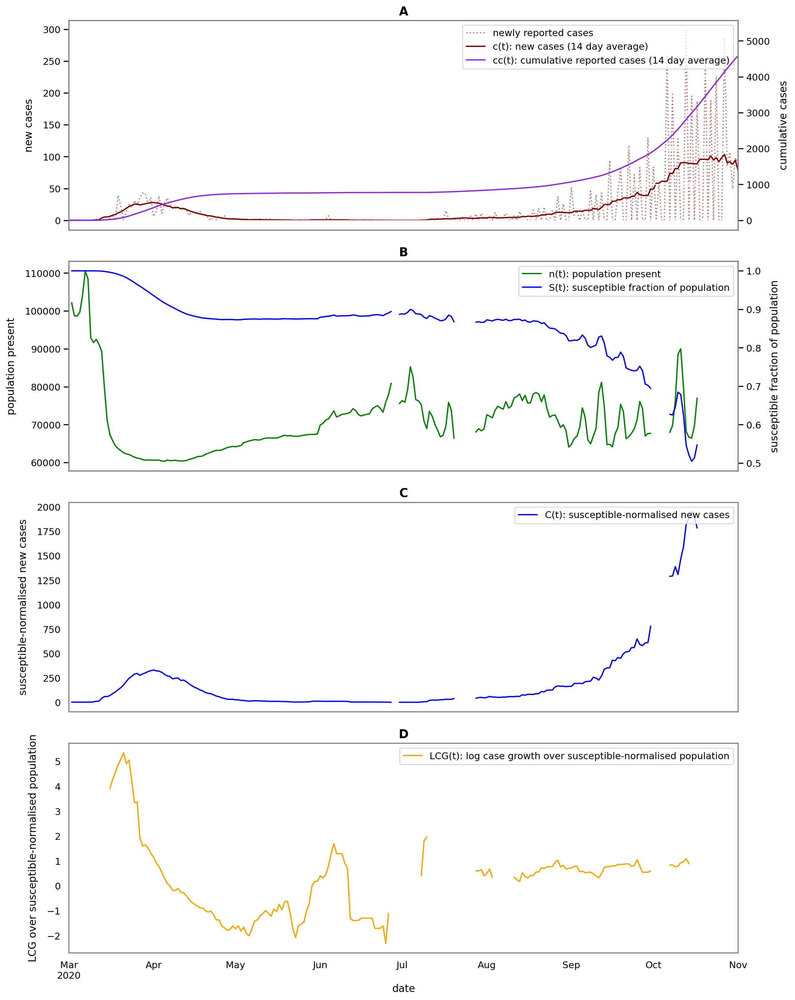

In [934]:
fig, axes = plt.subplots(4, figsize=(14, 4*5), dpi=100,
                         sharey=False,
                         sharex=True,
                        )
plt.subplots_adjust(hspace=0.15)

ax_cases = axes.flat[0]
ax_cc = ax_cases.twinx()
lns = []

lns += ax_cases.plot(cases[NEW_CASES], color=c_new_cases, alpha=0.5, 
                     linestyle='dotted', label='newly reported cases')
lns += ax_cases.plot(cases[NEW_CASES_SMOOTHED_14D], color=c_new_cases, 
                     label='c(t): '+NEW_CASES_SMOOTHED_14D)
lns += ax_cc.plot(cases[TOTAL_CASES_SMOOTHED_14D],
             color=c_cc, label='cc(t): cumulative reported cases (14 day average)')
ax_cases.set_xlim(datetime(2020,3,1,0,0), datetime(2020,11,1,0,0))
ax_cases.set_ylabel('new cases',labelpad=10)
ax_cc.set_ylabel('cumulative cases', labelpad=10)
labels = [l.get_label() for l in lns]
ax_cases.legend(lns, labels, loc='upper right')
ax_cases.grid(False)

ax1 = axes.flat[1]
ax2 = ax1.twinx()
lns = []
lns +=ax1.plot(presence_df[USERS_PRESENT].reindex(study_index),
             color=c_population_present, label='n(t): population present')
lns+=ax2.plot(cases['S'].reindex(study_index),
             color=c_susceptible_fraction_population, 
            label='S(t): susceptible fraction of population')
ax1.set_ylabel('population present', labelpad=10)
ax2.set_ylabel('susceptible fraction of population', labelpad=10)
labels = [l.get_label() for l in lns]
ax1.legend(lns, labels, loc='upper right')
ax1.grid(False)
ax2.grid(False)
    
ax_C = axes.flat[2]
cases['C'].reindex(study_index).plot(legend=True,ax=ax_C, 
                                     color=c_susceptible_fraction_population, 
                                     label=C_label)
ax_C.set_xlim(datetime(2020,3,1,0,0), datetime(2020,11,1,0,0))
ax_C.legend(loc='upper right')
ax_C.set_ylabel(C_label.replace('C(t): ', ''), labelpad=10)
ax_C.grid(False)

ax_LCG = axes.flat[3]
cases['LCG'].reindex(study_index).plot(legend=True,ax=ax_LCG, color=c_lcg, label=LCG_label)
ax_LCG.set_xlim(datetime(2020,3,1,0,0), datetime(2020,11,1,0,0))
ax_LCG.set_ylabel('LCG over susceptible-normalised population', labelpad=10)
ax_LCG.grid(False)
ax_LCG.legend(loc='upper right')

# add titles as letter labels
for ax, label in zip([ax_cases, ax1, ax_C, ax_LCG], ['A','B','C','D']):
    ax.set_title(label, fontweight='bold', fontsize=14)

## Save the modified cases data for sharing / rereading

In [120]:
owid_data_filepath = '../outputs/owid-covid-data-modified-14d-window-presence.csv'

In [121]:
print('saving modified cases data to', owid_data_filepath)
cases.to_csv(owid_data_filepath)

saving modified cases data to ../outputs/owid-covid-data-modified-14d-window-presence.csv


In [123]:
print('columns')
print(list(cases.columns))
cases.head()

columns
['new_cases', 'total_cases', 'new_deaths', 'total_deaths', 'new cases (7 day average)', 'new cases (14 day average)', 'cumulative cases (14 day average)', 'S', 'C', 'LCG']


,new_cases,total_cases,new_deaths,total_deaths,new cases (7 day average),new cases (14 day average),cumulative cases (14 day average),S,C,LCG
date,,,,,,,,,,
2020-03-01,0.0,0.0,0.0,0.0,0.250000,0.142857,0.714286,NaN,NaN,NaN
2020-03-02,0.0,0.0,0.0,0.0,0.200000,0.125000,0.750000,0.999919,1.375111,NaN
2020-03-03,1.0,1.0,0.0,0.0,0.166667,0.111111,0.777778,0.999913,1.222328,NaN
2020-03-04,0.0,1.0,0.0,0.0,0.142857,0.100000,0.800000,0.999911,1.100098,NaN
2020-03-05,0.0,1.0,0.0,0.0,0.142857,0.090909,0.818182,0.999910,1.000090,NaN


# Mobility metrics

make table with

```
date, total trips, trips between parishes,  users making trips, users making trips between parishes
```

Add additional columns:
- trips per users making trips
- users present
- portion of users staying home = (users present - users making trips) / (users present)
- country entrances

Additional table:
- trips by parish

In [282]:
PARISH = 'parish'
USERS_MAKING_TRIPS = 'users making trips'
TOTAL_TRIPS = 'total trips'

In [51]:
trips_df = pd.read_csv(METRICS_FPATH+'/trips.csv').set_index(DATE)
trips_df.index = pd.to_datetime(trips_df.index)
trips_df[USERS_PRESENT] = presence_df[USERS_PRESENT]
trips_df[ENTRANCES] = presence_df[ENTRANCES]
trips_df.head()

,users making trips,total trips,mean trips,median trips,users present,entrances
date,,,,,,
2020-01-01,73063,531963,5.789632,3.0,271112.0,0.0
2020-01-02,92473,696547,6.284994,4.0,256105.0,0.0
2020-01-03,89661,691506,6.485220,4.0,233915.0,0.0
2020-01-04,82706,595940,5.914509,4.0,213345.0,0.0
2020-01-05,73210,523706,5.805667,4.0,189763.0,0.0


## Users staying home

Make a table:

```
date, stay home users
```

Daily stay  home users computed as:

(stay home users) = (users present) - (users making trips)

where  

users making trips = users with more than 1 stay or one stay outside their home  parish

In [404]:
HOME_PARISH = 'home parish'
STAY_HOME_USERS = 'stay home users'
PORTION_STAY_HOME = 'portion of users staying home'


def get_stay_home_users_df(dates, user_days_present_df):
    month = None
    month_user_homes =  None
    records = []
    missing_dates = []
    for i, d in enumerate(dates):
        date_str =  d.strftime("%Y-%m-%d")
        if i % 50 == 0:
            print('%s/%s %s' %  (i, len(dates), date_str))
        if month != d.month:
            month_user_homes = pd.read_csv(get_homes_filepath(d.year, d.month))[
                [IMSI, PARISH]
            ].set_index(IMSI)[PARISH]
            month = d.month
        stays_filepath = get_stays_filepath(d.day, d.month, d.year)
        if not pathlib.Path(stays_filepath).is_file():
            print('%s\nfile not found: %s' % (date_str, stays_filepath))
            missing_dates += [d]
            continue
            
        df = pd.read_csv(stays_filepath)[[IMSI, PARISH]]
        # limit data to users in the homes data and add their home parish
        df[HOME_PARISH] = df[IMSI].map(month_user_homes)
        df = df.dropna()
        
        # compute daily stay home users as
        # stay home users = users - non_stay_home_users
        # where non_stay_home_users = (users with (> 1 stay | stay outside home parish)

        # get users with stays outside home parish
        users_w_stays_outside_home_set = set(df[df[PARISH]!=df[HOME_PARISH]][IMSI])
        # get users with more than one stay
        multiple_stays_users = (df[IMSI].value_counts() > 1) # maps IMSI -> boolean
        multiple_stays_users_set = set(multiple_stays_users[multiple_stays_users].index)
        # get set of users with more than one stay OR a stay outside home parish
        non_stay_home_users_set = multiple_stays_users_set.union(users_w_stays_outside_home_set)
        
        # get the number of users present that day who also had data in
        # the homes data (i.e. had recorded night stays)
        users_present = user_days_present_df[
            (user_days_present_df[date_str]>0)
        ].index.intersection(month_user_homes.index)
        n_users_present = len(users_present)
        n_stay_home_users = n_users_present - len(non_stay_home_users_set)
        
        records += [{
            DATE: d,
            STAY_HOME_USERS: n_stay_home_users,
            PORTION_STAY_HOME: n_stay_home_users/n_users_present,
        }]
    days_df = pd.DataFrame.from_records(records).set_index(DATE)
    return days_df, missing_dates

In [55]:
PRESENCE_TOURISTS_FPATH = PRIVATE_DATA_FPATH+'/presence/2020/presence_tourists.csv'
PRESENCE_OTHERS_FPATH = PRIVATE_DATA_FPATH+'/presence/2020/presence_others.csv'

In [ ]:
def read_presence_csv(fpath):
    return pd.read_csv(fpath).rename(
        columns={'Unnamed: 0': IMSI}
    ).set_index(IMSI)

In [405]:
user_days_present_df = read_presence_csv(
    PRESENCE_TOURISTS_FPATH).append(
    read_presence_csv(PRESENCE_OTHERS_FPATH))
print('%s total users with presence data' % len(users_days_present_df))

1288799 total users with presence data


In [406]:
stay_home_users_df, missing_dates = get_stay_home_users_df(
    datetimes, user_days_present_df)

0/274 2020-02-01
2020-02-14
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_14.csv
2020-02-15
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_15.csv
2020-02-16
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_16.csv
2020-02-17
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_17.csv
2020-02-18
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_18.csv
2020-02-19
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_19.csv
2020-02-20
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_20.csv
2020-02-21
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_21.csv
2020-02-22
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_22.csv
2020-02-23
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_23.csv
2020-02-24
fi

In [407]:
stay_home_users_df.head()

,stay home users,portion of users staying home
date,,
2020-02-01,17378,0.233556
2020-02-02,19032,0.250306
2020-02-03,13973,0.199868
2020-02-04,13719,0.198398
2020-02-05,13946,0.200766


## Plot it

<AxesSubplot:xlabel='date'>

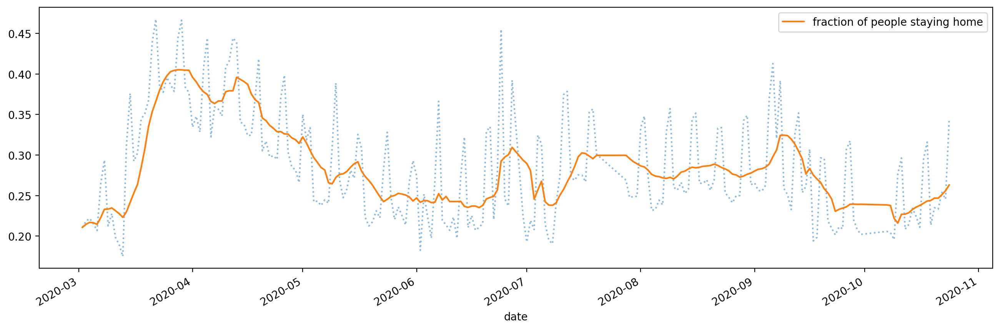

In [411]:
fig, ax= plt.subplots(1, figsize=(16, 5), dpi=100)

series = stay_home_users_df.loc['2020-03-01':'2020-10-24',]
index = series.index
series[PORTION_STAY_HOME].plot(label='_nolegend_',
                               ax=ax, alpha=0.5, linestyle='dotted')
series[PORTION_STAY_HOME].dropna().rolling(7, min_periods=1).mean().reindex(index).plot(
        label='fraction of people staying home',
        ax=ax, legend=True)

In [425]:
PORTION_NOT_STAY_HOME  = 'fraction of people not staying home'
trips_df[STAY_HOME_USERS] = trips_df.index.map(
    stay_home_users_df[STAY_HOME_USERS])
trips_df[PORTION_STAY_HOME] = trips_df.index.map(
    stay_home_users_df[PORTION_STAY_HOME])

trips_df[PORTION_NOT_STAY_HOME] = 1 - trips_df[PORTION_STAY_HOME]

trips_df.head()

,trips between parishes,users making trips between parishes,users making trips,total trips,users present,entrances,stay home users,portion of users staying home,fraction of people not staying home,trips between parishes from La Massana,trips between parishes from Sant Julià de Lòria,90th percentile trips
date,,,,,,,,,,,,
2020-02-01,155156,125402,83306,626784,123961.0,22717.0,17378,0.233556,0.766444,15666,14131,14.0
2020-02-02,129941,105880,77570,539776,120844.0,15201.0,19032,0.250306,0.749694,13524,9988,13.0
2020-02-03,161468,124277,73777,622863,104236.0,7847.0,13973,0.199868,0.800132,15984,13416,16.0
2020-02-04,159259,122583,72300,626587,102475.0,5391.0,13719,0.198398,0.801602,16179,13183,16.0
2020-02-05,159649,123824,72509,623190,102725.0,5732.0,13946,0.200766,0.799234,15963,13352,16.0


## Daily users making trips between parishes

a. Daily users making trips into parishes

b. Daily users making trips out of parishes

A trip between 2 parishes, A and B, is counted when a user has a stay in parish A that is directly followed by a stay in parish B.

Make a table: date, origin parish, destination parish, trips, users

In [132]:
ORIGIN_PARISH = 'origin parish'
DESTINATION_PARISH = 'destination parish'
STAY_START  = 's'
USERS = 'users'
TRIPS = 'trips'

parishes = ['Andorra la Vella', 'Canillo', 'Encamp', 'Escaldes-Engordany',
            'La Massana', 'Ordino', 'Sant Julià de Lòria']

In [138]:
def get_trips_between_parishes_df(dates):
    records = []
    for i, d in enumerate(dates):
        stays_filepath = get_stays_filepath(d.day, d.month, d.year)
        date_str =  d.strftime("%Y-%m-%d")
        if i%50==0:
            print('%s/%s %s' %  (i, len(dates), date_str))
        if not pathlib.Path(stays_filepath).is_file():
            print('skipping %s -- file not found: %s' % (date_str, stays_filepath))
            continue
        df = pd.read_csv(stays_filepath).dropna()[[IMSI, PARISH, STAY_START]]
        df.sort_values([IMSI, STAY_START],inplace=True)
        df['prev imsi'] = df[IMSI].shift()
        df['prev parish'] = df[PARISH].shift()
        for origin_parish in parishes:
            for destination_parish in parishes:
                if origin_parish == destination_parish:
                    continue
                od_df = df[(df[IMSI]==df['prev imsi']) \
                           & (df['prev parish']==origin_parish) \
                           & (df[PARISH]==destination_parish)]

                records += [{
                    DATE: d,
                    ORIGIN_PARISH: origin_parish,
                    DESTINATION_PARISH: destination_parish,
                    TOTAL_TRIPS: len(od_df),
                    USERS: od_df[IMSI].nunique(),
                }]
    trips_between_parishes_df = pd.DataFrame.from_records(records)
    return trips_between_parishes_df

In [139]:
trips_between_parishes_df = get_trips_between_parishes_df(datetimes)

0/274 2020-02-01
skipping 2020-02-14 -- file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_14.csv
skipping 2020-02-15 -- file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_15.csv
skipping 2020-02-16 -- file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_16.csv
skipping 2020-02-17 -- file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_17.csv
skipping 2020-02-18 -- file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_18.csv
skipping 2020-02-19 -- file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_19.csv
skipping 2020-02-20 -- file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_20.csv
skipping 2020-02-21 -- file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_21.csv
skipping 2020-02-22 -- file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_22.csv
sk

In [313]:
trips_between_parishes_df.head()

,origin parish,destination parish,total trips,users
date,,,,
2020-02-01,Andorra la Vella,Canillo,2977,2885
2020-02-01,Andorra la Vella,Encamp,3914,3565
2020-02-01,Andorra la Vella,Escaldes-Engordany,21613,14527
2020-02-01,Andorra la Vella,La Massana,5506,5011
2020-02-01,Andorra la Vella,Ordino,1395,1283


In [314]:
TRIPS_BETWEEN_PARISHES = 'trips between parishes'
USERS_MAKING_TRIPS_BETWEEN_PARISHES = 'users making trips between parishes'

In [315]:
trips_df = pd.concat([
    trips_between_parishes_df.groupby(DATE).sum().rename(columns={
        TOTAL_TRIPS:TRIPS_BETWEEN_PARISHES,
        USERS: USERS_MAKING_TRIPS_BETWEEN_PARISHES,
    }),
    trips_df
], axis=1)
trips_df.head()

,trips between parishes,users making trips between parishes,users making trips,total trips,users present,entrances,stay home users,portion of users staying home
date,,,,,,,,
2020-02-01,155156,125402,83306,626784,123961.0,22717.0,66933.0,0.539952
2020-02-02,129941,105880,77570,539776,120844.0,15201.0,63841.0,0.528293
2020-02-03,161468,124277,73777,622863,104236.0,7847.0,48298.0,0.463352
2020-02-04,159259,122583,72300,626587,102475.0,5391.0,47045.0,0.459088
2020-02-05,159649,123824,72509,623190,102725.0,5732.0,47207.0,0.459547


### Looking more closely at trips between parishes

We know that some parishes had higher infection rates than others. Do trips from these parishes better correspond to growth in cases?

Parishes with highest infection rates:
- La Massana
- Sant Julià de Lòria

In [ ]:
trips_between_parishes_df = trips_between_parishes_df.set_index(DATE)
trips_between_parishes_df.head()

Plot number of trips *out* of each parish

In [321]:
cmap = plt.get_cmap("tab10")
parish_cmap = {sorted(parishes)[i]:cmap(i) for i in range(len(parishes))}
all_parishes_color = 'gray'

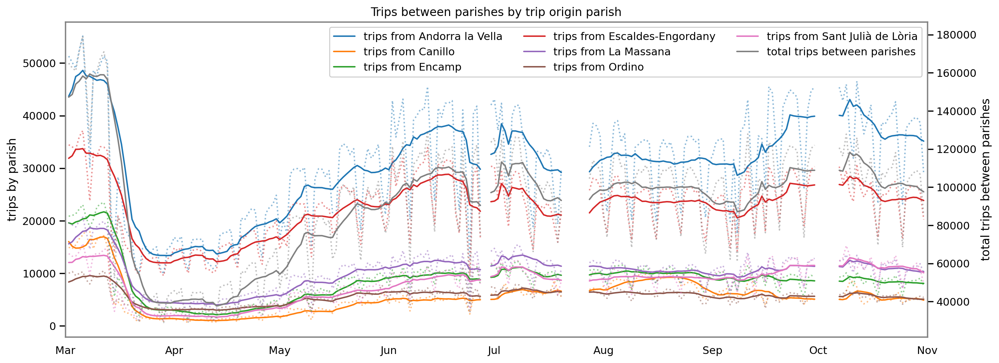

In [789]:
fig, axes = plt.subplots(1, figsize=(16, 6), dpi=100)

ax_trips = axes
ax_trips.set_title('Trips between parishes by trip origin parish')
ax_all_trips = ax_trips.twinx()

trips_from_p_df =  None
ls = []
for p in parishes:
    trips_from_p = trips_between_parishes_df[
        (trips_between_parishes_df[ORIGIN_PARISH]==p)
    ][TOTAL_TRIPS].groupby(DATE).sum()
    
    ax_trips.plot(
        trips_from_p.reindex(cases.index),
        label='_nolegend_',
        color=parish_cmap[p], alpha=0.5, linestyle='dotted')
    ls += ax_trips.plot(
        trips_from_p.dropna().rolling(7, min_periods=1).mean().reindex(cases.index),
        label='trips from %s'%p,
        color=parish_cmap[p], 
    )
    
ax_all_trips.plot(
    trips_df[TRIPS_BETWEEN_PARISHES].reindex(cases.index),
    label='_nolegend_',
    color=all_parishes_color, alpha=0.5, linestyle='dotted')
ls += ax_all_trips.plot(
    trips_df.dropna()[TRIPS_BETWEEN_PARISHES].rolling(7, min_periods=1).mean().reindex(cases.index),
    color=all_parishes_color, label='total trips between parishes')

ax_trips.set_ylabel('trips by parish')
ax_all_trips.set_ylabel('total trips between parishes')

labels = [l.get_label() for l in ls]
axes.legend(ls, labels, 
            #bbox_to_anchor=(1.3, 1), 
            loc='upper right', 
            ncol=3,
            framealpha=1
           )

import matplotlib.dates as mdates
myFmt = mdates.DateFormatter('%b')
for ax in [ax_trips, ax_all_trips]:
    ax.set_xlim(study_datetimes[0],datetime(2020, 11, 1, 0, 0))
    ax.xaxis.set_major_formatter(myFmt)
    ax.grid(which='major', axis='y', alpha=0)

In [150]:
TRIPS_BETWEEN_PARISHES_FROM_LM = 'trips between parishes from La Massana'
TRIPS_BETWEEN_PARISHES_FROM_SJ = 'trips between parishes from Sant Julià de Lòria'

trips_from_lm = trips_between_parishes_df[trips_between_parishes_df[ORIGIN_PARISH]=='La Massana'][TOTAL_TRIPS].groupby(DATE).sum()
trips_from_sj = trips_between_parishes_df[trips_between_parishes_df[ORIGIN_PARISH]=='Sant Julià de Lòria'][TOTAL_TRIPS].groupby(DATE).sum()

# Plot it all



In [347]:
cases.head()

,new_cases,total_cases,new_deaths,total_deaths,new cases (7 day average),new cases (14 day average),cumulative cases (14 day average),S,C,LCG
date,,,,,,,,,,
2020-03-01,0.0,0.0,0.0,0.0,0.250000,0.142857,0.714286,NaN,NaN,NaN
2020-03-02,0.0,0.0,0.0,0.0,0.200000,0.125000,0.750000,0.999919,1.375111,NaN
2020-03-03,1.0,1.0,0.0,0.0,0.166667,0.111111,0.777778,0.999913,1.222328,NaN
2020-03-04,0.0,1.0,0.0,0.0,0.142857,0.100000,0.800000,0.999911,1.100098,NaN
2020-03-05,0.0,1.0,0.0,0.0,0.142857,0.090909,0.818182,0.999910,1.000090,NaN


In [348]:
trips_df.head()

,trips between parishes,users making trips between parishes,users making trips,total trips,users present,entrances,stay home users,portion of users staying home
date,,,,,,,,
2020-02-01,155156,125402,83306,626784,123961.0,22717.0,66933.0,0.539952
2020-02-02,129941,105880,77570,539776,120844.0,15201.0,63841.0,0.528293
2020-02-03,161468,124277,73777,622863,104236.0,7847.0,48298.0,0.463352
2020-02-04,159259,122583,72300,626587,102475.0,5391.0,47045.0,0.459088
2020-02-05,159649,123824,72509,623190,102725.0,5732.0,47207.0,0.459547


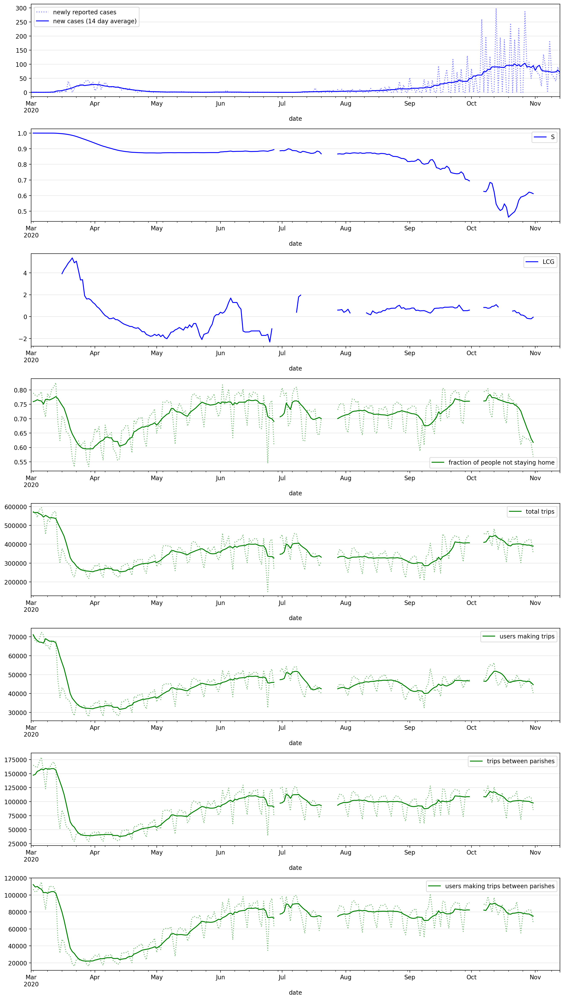

In [413]:
fig, ax= plt.subplots(8, figsize=(16, 30), dpi=100)
infections_color = 'blue'
mobility_color = 'green'
plt.subplots_adjust(hspace=0.35)
cases[NEW_CASES].plot(legend=True, ax=ax[0], color='blue', alpha=0.5, linestyle='dotted', label='newly reported cases')
cases[NEW_CASES_SMOOTHED_14D].plot(legend=True, ax=ax[0], color='blue')

cases['S'].plot(legend=True, ax=ax[1], color='blue')

cases['LCG'].plot(legend=True, ax=ax[2], color='blue')

trips_df[PORTION_NOT_STAY_HOME].reindex(cases.index).plot(
    ax=ax[3], color=mobility_color, alpha=0.5, linestyle='dotted')
trips_df.dropna()[PORTION_NOT_STAY_HOME].rolling(7, min_periods=1).mean().reindex(cases.index).plot(
    legend=True, ax=ax[3], color=mobility_color)


trips_df[TOTAL_TRIPS].reindex(cases.index).plot(
    ax=ax[4], color=mobility_color, alpha=0.5, linestyle='dotted')
trips_df.dropna()[TOTAL_TRIPS].rolling(7, min_periods=1).mean().reindex(cases.index).plot(
    legend=True, ax=ax[4], color=mobility_color)

trips_df[USERS_MAKING_TRIPS].reindex(cases.index).plot(
    ax=ax[5], color=mobility_color, alpha=0.5, linestyle='dotted')
trips_df.dropna()[USERS_MAKING_TRIPS].rolling(7, min_periods=1).mean().reindex(cases.index).plot(
    legend=True, ax=ax[5], color=mobility_color)

trips_df[TRIPS_BETWEEN_PARISHES].reindex(cases.index).plot(
    ax=ax[6], color=mobility_color, alpha=0.5, linestyle='dotted')
trips_df.dropna()[TRIPS_BETWEEN_PARISHES].rolling(7, min_periods=1).mean().reindex(cases.index).plot(
    legend=True, ax=ax[6], color=mobility_color)

trips_df[USERS_MAKING_TRIPS_BETWEEN_PARISHES].reindex(cases.index).plot(
    ax=ax[7], color=mobility_color, alpha=0.5, linestyle='dotted')
trips_df.dropna()[USERS_MAKING_TRIPS_BETWEEN_PARISHES].rolling(7, min_periods=1).mean().reindex(cases.index).plot(
    legend=True, ax=ax[7], color=mobility_color)


for axis in ax:
    axis.grid(which='major', axis='y', c='k', alpha=.1, zorder=-2)

Consolidating to fewer plots with obervations:

- The daily number of total trips is highly correlated  with the daily number of users making trips
- Daily total trips highly correlated  with daily trips between parishes

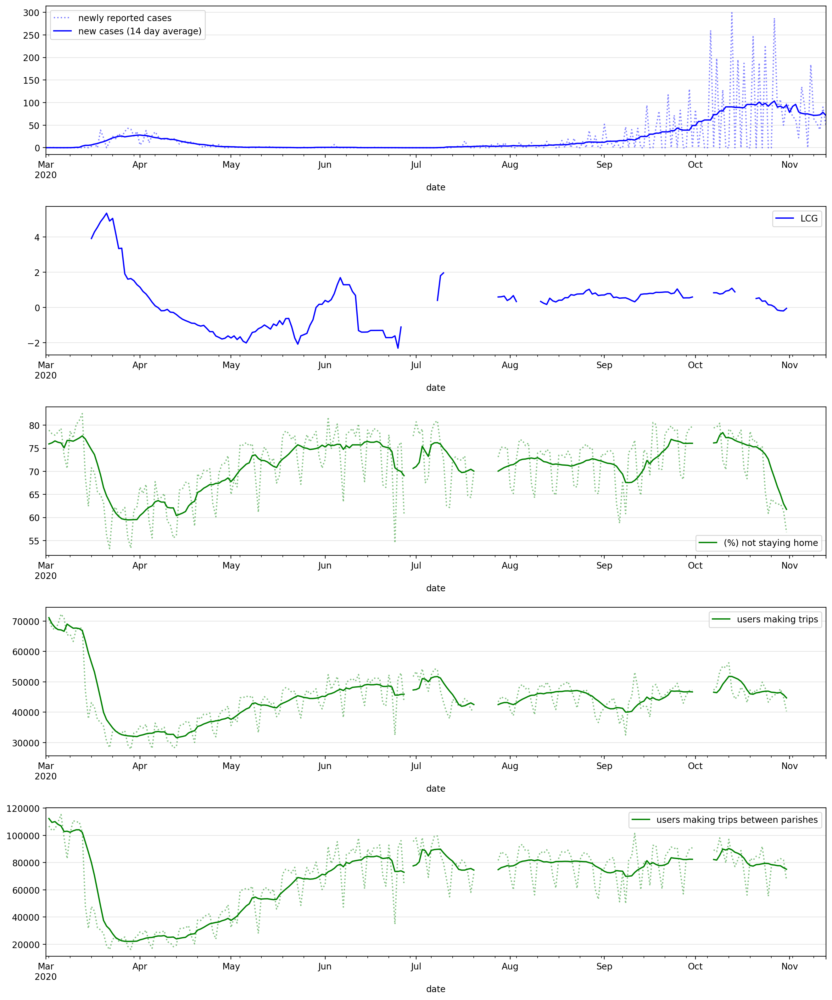

In [414]:
fig, ax= plt.subplots(5, figsize=(16, 20), dpi=100)
infections_color = 'blue'
mobility_color = 'green'
plt.subplots_adjust(hspace=0.35)
cases[NEW_CASES].plot(legend=True, ax=ax[0], color='blue', alpha=0.5, linestyle='dotted', label='newly reported cases')
cases[NEW_CASES_SMOOTHED_14D].plot(legend=True, ax=ax[0], color='blue')

cases['LCG'].plot(legend=True, ax=ax[1], color='blue')

not_staying_home_percent = 100*(1-trips_df[PORTION_STAY_HOME]).dropna()
not_staying_home_percent.reindex(cases.index).plot(
    ax=ax[2], color=mobility_color, alpha=0.5, linestyle='dotted')
not_staying_home_percent.rolling(7, min_periods=1).mean().reindex(cases.index).plot(
    legend=True, ax=ax[2], color=mobility_color,label='(%) not staying home')

trips_df[USERS_MAKING_TRIPS].reindex(cases.index).plot(
    ax=ax[3], color=mobility_color, alpha=0.5, linestyle='dotted')
trips_df.dropna()[USERS_MAKING_TRIPS].rolling(7, min_periods=1).mean().reindex(cases.index).plot(
    legend=True, ax=ax[3], color=mobility_color)

trips_df[USERS_MAKING_TRIPS_BETWEEN_PARISHES].reindex(cases.index).plot(
    ax=ax[4], color=mobility_color, alpha=0.5, linestyle='dotted')
trips_df.dropna()[USERS_MAKING_TRIPS_BETWEEN_PARISHES].rolling(7, min_periods=1).mean().reindex(cases.index).plot(
    legend=True, ax=ax[4], color=mobility_color)

for axis in ax:
    axis.grid(which='major', axis='y', c='k', alpha=.1, zorder=-2)

## User Trip Behavior

Look at the distribution of trips per user: Average trips per user vs 99% trips per user.

Make table:
```
date, mean trips, median trips, 90th percentile trips, 99th percentile trips
```

Where trips are 'per user' and based  on the estimated number of users present in the country on the given date. Users reporting no data have 0s filled  in for their number of trips.

Separate data for likely tourists vs others.
Since  tourists had sparser data -- could focus on just  others.

Also do by Parish or MCC?

In [ ]:
o_days_present_df = pd.read_csv(PRESENCE_OTHERS_FPATH).rename(
    columns={'Unnamed: 0': IMSI}).set_index(IMSI)
t_days_present_df = pd.read_csv(PRESENCE_TOURISTS_FPATH).rename(
    columns={'Unnamed: 0': IMSI}).set_index(IMSI)
days_present_df = t_days_present_df.append(o_days_present_df)
# print(t_days_present_df.shape)
# print(o_days_present_df.shape)
# print(days_present_df.shape)
# days_present_df.head()

In [155]:
TRIPS_COUNT = 'trips'
TRIPS_MEAN = 'mean trips'
TRIPS_MEDIAN = 'median trips'
TRIPS_80_PCT  = '80th percentile trips'
TRIPS_90_PCT  = '90th percentile trips'
TRIPS_99_PCT  = '99th percentile trips'

def get_trips_per_user_df(dates, days_present_df):
    users = days_present_df.index
    records = []
    missing_dates = []
    for i, d in enumerate(dates):
        stays_filepath = get_stays_filepath(d.day, d.month, d.year)
        date_str =  d.strftime("%Y-%m-%d")
        if i%50==0:
            print('%s/%s %s' %  (i, len(dates), date_str))
        if not pathlib.Path(stays_filepath).is_file():
            missing_dates += [d]
            print('%s\nfile not found: %s' % (date_str, stays_filepath))
            continue
        
        df = pd.read_csv(stays_filepath)[[IMSI, PARISH]].dropna() # drop stays occuring outside a parish
        # restrict data to users from days present df
        df = df[df[IMSI].isin(users)]
        reported_stays = np.array(df[IMSI].value_counts())
        # get the number of total estimated users present on that day
        users_present = len(days_present_df[days_present_df[d.strftime("%Y-%m-%d")]!=0])
        unreported_users = users_present - len(reported_stays)
        # add in dummy stay for unreported users
        total_stays = np.append(reported_stays, np.array([1]*unreported_users))
        trips = (total_stays - 1)
        records +=  [{
            DATE: d,
            USERS: users_present,
            TRIPS_MEAN: np.mean(trips),
            TRIPS_MEDIAN: np.median(trips),
            TRIPS_80_PCT: np.percentile(trips, 80),
            TRIPS_90_PCT: np.percentile(trips, 90),
            TRIPS_99_PCT: np.percentile(trips, 99),
        }]
    trips_per_user_df = pd.DataFrame.from_records(records)
    return trips_per_user_df, missing_dates

In [156]:
t_trips_per_user_df, missing_dates = get_trips_per_user_df(datetimes, t_days_present_df)
t_trips_per_user_df = t_trips_per_user_df.set_index(DATE)
t_trips_per_user_df.head()

0/274 2020-02-01
2020-02-14
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_14.csv
2020-02-15
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_15.csv
2020-02-16
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_16.csv
2020-02-17
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_17.csv
2020-02-18
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_18.csv
2020-02-19
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_19.csv
2020-02-20
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_20.csv
2020-02-21
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_21.csv
2020-02-22
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_22.csv
2020-02-23
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_23.csv
2020-02-24
fi

,users,mean trips,median trips,80th percentile trips,90th percentile trips,99th percentile trips
date,,,,,,
2020-02-01,58911,3.997165,2.0,7.0,11.0,28.0
2020-02-02,55753,3.386203,1.0,6.0,9.0,25.0
2020-02-03,39217,3.594079,1.0,6.0,10.0,27.0
2020-02-04,37407,3.505547,1.0,6.0,10.0,27.0
2020-02-05,37550,3.515819,1.0,6.0,10.0,27.0


In [157]:
o_trips_per_user_df, missing_dates = get_trips_per_user_df(datetimes, o_days_present_df)
o_trips_per_user_df = o_trips_per_user_df.set_index(DATE)
o_trips_per_user_df.head()

0/274 2020-02-01
2020-02-14
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_14.csv
2020-02-15
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_15.csv
2020-02-16
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_16.csv
2020-02-17
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_17.csv
2020-02-18
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_18.csv
2020-02-19
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_19.csv
2020-02-20
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_20.csv
2020-02-21
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_21.csv
2020-02-22
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_22.csv
2020-02-23
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_23.csv
2020-02-24
fi

,users,mean trips,median trips,80th percentile trips,90th percentile trips,99th percentile trips
date,,,,,,
2020-02-01,65050,6.015480,3.0,11.0,16.0,31.00
2020-02-02,65091,5.392220,3.0,10.0,15.0,31.00
2020-02-03,65019,7.411895,5.0,13.0,18.0,31.82
2020-02-04,65068,7.614419,6.0,14.0,18.0,32.00
2020-02-05,65175,7.536187,5.0,13.0,18.0,31.00


In [158]:
all_trips_per_user_df, missing_dates = get_trips_per_user_df(datetimes, days_present_df)
all_trips_per_user_df = all_trips_per_user_df.set_index(DATE)
all_trips_per_user_df.head()

0/274 2020-02-01
2020-02-14
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_14.csv
2020-02-15
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_15.csv
2020-02-16
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_16.csv
2020-02-17
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_17.csv
2020-02-18
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_18.csv
2020-02-19
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_19.csv
2020-02-20
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_20.csv
2020-02-21
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_21.csv
2020-02-22
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_22.csv
2020-02-23
file not found: /home/data_commons/andorra_data_2020/stays/2020_2/stays_2020_2_23.csv
2020-02-24
fi

,users,mean trips,median trips,80th percentile trips,90th percentile trips,99th percentile trips
date,,,,,,
2020-02-01,123961,5.056300,2.0,9.0,14.0,30.0
2020-02-02,120844,4.466717,2.0,8.0,13.0,29.0
2020-02-03,104236,5.975508,3.0,11.0,16.0,30.0
2020-02-04,102475,6.114535,3.0,11.0,16.0,31.0
2020-02-05,102725,6.066586,3.0,11.0,16.0,30.0


## Plots

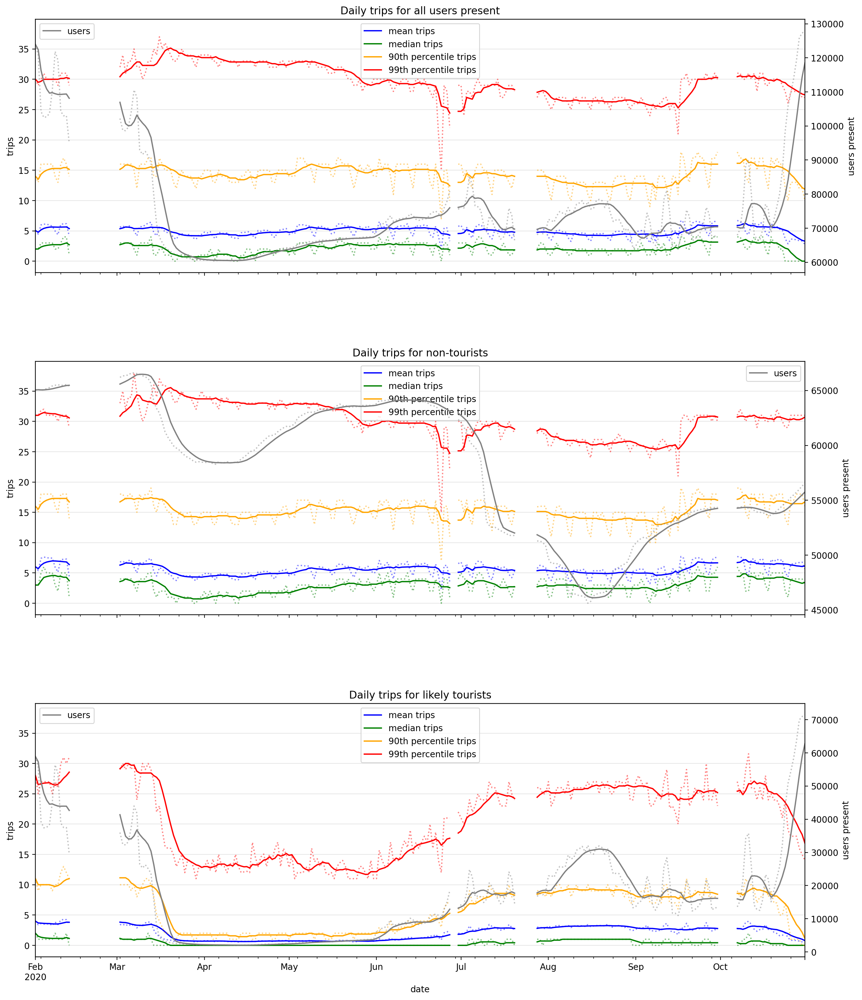

In [159]:
fig, ax= plt.subplots(3, figsize=(16, 20), dpi=100, sharey=True)
plt.subplots_adjust(hspace=0.35)

trips_mean_color = 'blue'
trips_median_color = 'green'
trips_90pct_color = 'orange'
trips_99pct_color = 'red'

presence_color = 'gray'

all_ax = ax[0]
ax[0].set_title('Daily trips for all users present')
all_ax2 = all_ax.twinx()
all_ax.set_ylabel('trips')
all_ax2.set_ylabel('users present')

all_trips_per_user_df[TRIPS_MEAN].reindex(datetimes).plot(
    ax=ax[0], color=trips_mean_color, alpha=0.5, linestyle='dotted',label='_nolegend_')
all_trips_per_user_df.dropna()[TRIPS_MEAN].rolling(7, min_periods=1).mean().reindex(datetimes).plot(
    ax=ax[0], legend=True, color=trips_mean_color)

all_trips_per_user_df[TRIPS_MEDIAN].reindex(datetimes).plot(
    ax=ax[0], color=trips_median_color, alpha=0.5, linestyle='dotted',label='_nolegend_')
all_trips_per_user_df.dropna()[TRIPS_MEDIAN].rolling(7, min_periods=1).mean().reindex(datetimes).plot(
    ax=ax[0], legend=True, color=trips_median_color)

all_trips_per_user_df[TRIPS_90_PCT].reindex(datetimes).plot(
    ax=ax[0], color=trips_90pct_color, alpha=0.5, linestyle='dotted',label='_nolegend_')
all_trips_per_user_df.dropna()[TRIPS_90_PCT].rolling(7, min_periods=1).mean().reindex(datetimes).plot(
    ax=ax[0], legend=True, color=trips_90pct_color)

all_trips_per_user_df[TRIPS_99_PCT].reindex(datetimes).plot(
    ax=ax[0], color=trips_99pct_color, alpha=0.5, linestyle='dotted',label='_nolegend_')
all_trips_per_user_df.dropna()[TRIPS_99_PCT].rolling(7, min_periods=1).mean().reindex(datetimes).plot(
    ax=ax[0], legend=True, color=trips_99pct_color)

all_trips_per_user_df[USERS].reindex(datetimes).plot(
    ax=all_ax2, color=presence_color, alpha=0.5, linestyle='dotted',label='_nolegend_')
all_trips_per_user_df.dropna()[USERS].rolling(7, min_periods=1).mean().reindex(datetimes).plot(
    ax=all_ax2, legend=True, color=presence_color)

o_ax = ax[1]
o_ax.set_title('Daily trips for non-tourists')
o_ax2 = o_ax.twinx()
o_ax.set_ylabel('trips')
o_ax2.set_ylabel('users present')

o_trips_per_user_df[TRIPS_MEAN].reindex(datetimes).plot(
    ax=ax[1], color=trips_mean_color, alpha=0.5, linestyle='dotted',label='_nolegend_')
o_trips_per_user_df.dropna()[TRIPS_MEAN].rolling(7, min_periods=1).mean().reindex(datetimes).plot(
    ax=ax[1], legend=True, color=trips_mean_color)

o_trips_per_user_df[TRIPS_MEDIAN].reindex(datetimes).plot(
    ax=ax[1], color=trips_median_color, alpha=0.5, linestyle='dotted',label='_nolegend_')
o_trips_per_user_df.dropna()[TRIPS_MEDIAN].rolling(7, min_periods=1).mean().reindex(datetimes).plot(
    ax=ax[1], legend=True, color=trips_median_color)

o_trips_per_user_df[TRIPS_90_PCT].reindex(datetimes).plot(
    ax=ax[1], color=trips_90pct_color, alpha=0.5, linestyle='dotted',label='_nolegend_')
o_trips_per_user_df.dropna()[TRIPS_90_PCT].rolling(7, min_periods=1).mean().reindex(datetimes).plot(
    ax=ax[1], legend=True, color=trips_90pct_color)

o_trips_per_user_df[TRIPS_99_PCT].reindex(datetimes).plot(
    ax=ax[1], color=trips_99pct_color, alpha=0.5, linestyle='dotted',label='_nolegend_')
o_trips_per_user_df.dropna()[TRIPS_99_PCT].rolling(7, min_periods=1).mean().reindex(datetimes).plot(
    ax=ax[1], legend=True, color=trips_99pct_color)

o_trips_per_user_df[USERS].reindex(datetimes).plot(
    ax=o_ax2, color=presence_color, alpha=0.5, linestyle='dotted',label='_nolegend_')
o_trips_per_user_df.dropna()[USERS].rolling(7, min_periods=1).mean().reindex(datetimes).plot(
    ax=o_ax2, legend=True, color=presence_color)


t_ax = ax[2]
t_ax.set_title('Daily trips for likely tourists')
t_ax2 = t_ax.twinx()
t_ax.set_ylabel('trips')
t_ax2.set_ylabel('users present')

t_trips_per_user_df[TRIPS_MEAN].reindex(datetimes).plot(
    ax=t_ax, color=trips_mean_color, alpha=0.5, linestyle='dotted',label='_nolegend_')
t_trips_per_user_df.dropna()[TRIPS_MEAN].rolling(7, min_periods=1).mean().reindex(datetimes).plot(
    ax=t_ax, legend=True, color=trips_mean_color)

t_trips_per_user_df[TRIPS_MEDIAN].reindex(datetimes).plot(
    ax=t_ax, color=trips_median_color, alpha=0.5, linestyle='dotted',label='_nolegend_')
t_trips_per_user_df.dropna()[TRIPS_MEDIAN].rolling(7, min_periods=1).mean().reindex(datetimes).plot(
    ax=t_ax, legend=True, color=trips_median_color)

t_trips_per_user_df[TRIPS_90_PCT].reindex(datetimes).plot(
    ax=t_ax, color=trips_90pct_color, alpha=0.5, linestyle='dotted',label='_nolegend_')
t_trips_per_user_df.dropna()[TRIPS_90_PCT].rolling(7, min_periods=1).mean().reindex(datetimes).plot(
    ax=t_ax, legend=True, color=trips_90pct_color)

t_trips_per_user_df[TRIPS_99_PCT].reindex(datetimes).plot(
    ax=t_ax, color=trips_99pct_color, alpha=0.5, linestyle='dotted',label='_nolegend_')
t_trips_per_user_df.dropna()[TRIPS_99_PCT].rolling(7, min_periods=1).mean().reindex(datetimes).plot(
    ax=t_ax, legend=True, color=trips_99pct_color)

t_trips_per_user_df[USERS].reindex(datetimes).plot(
    ax=t_ax2, color=presence_color, alpha=0.5, linestyle='dotted',label='_nolegend_')
t_trips_per_user_df.dropna()[USERS].rolling(7, min_periods=1).mean().reindex(datetimes).plot(
    ax=t_ax2, legend=True, color=presence_color)

for axis in ax:
    axis.grid(which='major', axis='y', c='k', alpha=.1, zorder=-2)

Plots for most active likely tourists are different during lockdown than from other users, but were enough tourists present during that time for this to be a valid group to study during that period?

In [160]:
d1,d2 = '2020-03-16','2020-07-01'
t_trips_per_user_df.reindex(datetimes)[d1:d2]

,users,mean trips,median trips,80th percentile trips,90th percentile trips,99th percentile trips
date,,,,,,
2020-03-16,4417.0,1.493095,0.0,2.0,4.0,23.00
2020-03-17,3658.0,1.218425,0.0,1.0,3.0,19.00
2020-03-18,3172.0,0.943253,0.0,1.0,2.0,16.29
2020-03-19,2948.0,0.899593,0.0,0.0,2.0,16.00
2020-03-20,2790.0,0.845161,0.0,0.0,2.0,16.00
...,...,...,...,...,...,...
2020-06-27,18466.0,2.452724,0.0,4.0,7.0,21.00
2020-06-28,NaN,NaN,NaN,NaN,NaN,NaN
2020-06-29,NaN,NaN,NaN,NaN,NaN,NaN


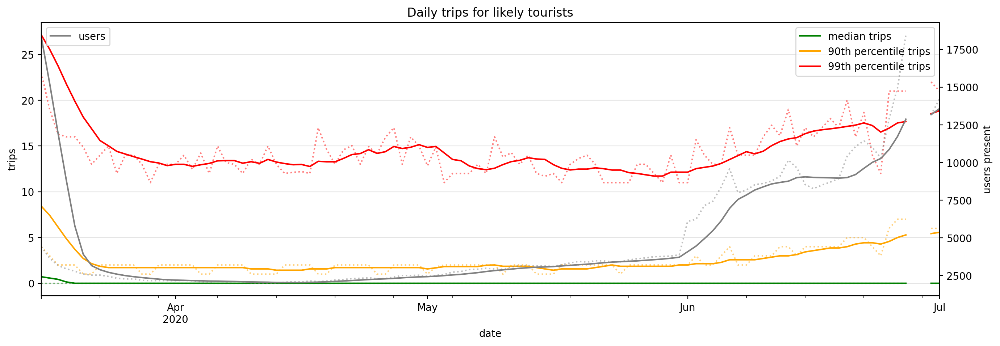

In [161]:
fig, t_ax= plt.subplots(1, figsize=(16, 5), dpi=100)

t_ax.set_title('Daily trips for likely tourists')
t_ax2 = t_ax.twinx()
t_ax.set_ylabel('trips')
t_ax2.set_ylabel('users present')

t_trips_per_user_df[TRIPS_MEDIAN].reindex(datetimes)[d1:d2].plot(
    ax=t_ax, color=trips_median_color, alpha=0.5, linestyle='dotted',label='_nolegend_')
t_trips_per_user_df.dropna()[TRIPS_MEDIAN].rolling(7, min_periods=1).mean().reindex(datetimes)[d1:d2].plot(
    ax=t_ax, legend=True, color=trips_median_color)

t_trips_per_user_df[TRIPS_90_PCT].reindex(datetimes)[d1:d2].plot(
    ax=t_ax, color=trips_90pct_color, alpha=0.5, linestyle='dotted',label='_nolegend_')
t_trips_per_user_df.dropna()[TRIPS_90_PCT].rolling(7, min_periods=1).mean().reindex(datetimes)[d1:d2].plot(
    ax=t_ax, legend=True, color=trips_90pct_color)

t_trips_per_user_df[TRIPS_99_PCT].reindex(datetimes)[d1:d2].plot(
    ax=t_ax, color=trips_99pct_color, alpha=0.5, linestyle='dotted',label='_nolegend_')
t_trips_per_user_df.dropna()[TRIPS_99_PCT].rolling(7, min_periods=1).mean().reindex(datetimes)[d1:d2].plot(
    ax=t_ax, legend=True, color=trips_99pct_color)

t_trips_per_user_df[USERS].reindex(datetimes)[d1:d2].plot(
    ax=t_ax2, color=presence_color, alpha=0.5, linestyle='dotted',label='_nolegend_')
t_trips_per_user_df.dropna()[USERS].rolling(7, min_periods=1).mean().reindex(datetimes)[d1:d2].plot(
    ax=t_ax2, legend=True, color=presence_color)

t_ax.grid(which='major', axis='y', c='k', alpha=.1, zorder=-2)

## Activity Multipliers

How many more trips the top 10% most active users made than the average user


In [162]:
all_trips_per_user_df.head()

,users,mean trips,median trips,80th percentile trips,90th percentile trips,99th percentile trips
date,,,,,,
2020-02-01,123961,5.056300,2.0,9.0,14.0,30.0
2020-02-02,120844,4.466717,2.0,8.0,13.0,29.0
2020-02-03,104236,5.975508,3.0,11.0,16.0,30.0
2020-02-04,102475,6.114535,3.0,11.0,16.0,31.0
2020-02-05,102725,6.066586,3.0,11.0,16.0,30.0


In [163]:
MULTIPLIER_AVG_VS_90PCT = 'Multiplier (avg vs 90% most active)'
all_trips_per_user_df[MULTIPLIER_AVG_VS_90PCT] = all_trips_per_user_df[TRIPS_90_PCT]/all_trips_per_user_df[TRIPS_MEDIAN]
all_trips_per_user_df.head()

,users,mean trips,median trips,80th percentile trips,90th percentile trips,99th percentile trips,Multiplier (avg vs 90% most active)
date,,,,,,,
2020-02-01,123961,5.056300,2.0,9.0,14.0,30.0,7.000000
2020-02-02,120844,4.466717,2.0,8.0,13.0,29.0,6.500000
2020-02-03,104236,5.975508,3.0,11.0,16.0,30.0,5.333333
2020-02-04,102475,6.114535,3.0,11.0,16.0,31.0,5.333333
2020-02-05,102725,6.066586,3.0,11.0,16.0,30.0,5.333333


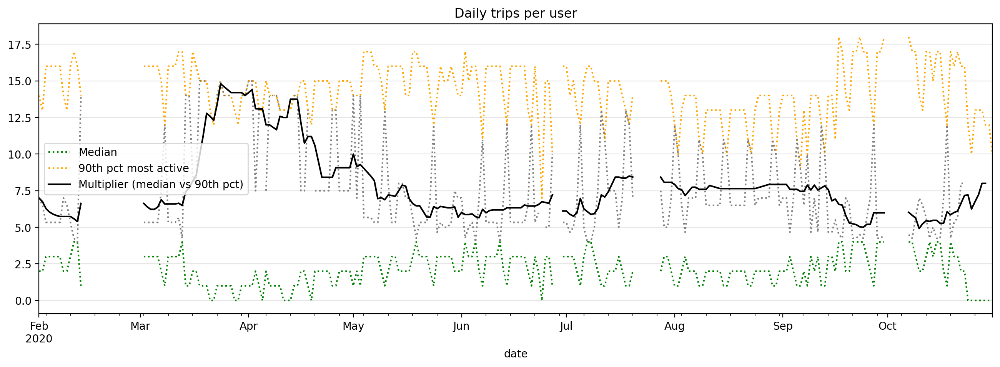

In [164]:
fig, ax= plt.subplots(1, figsize=(16, 5), dpi=100)

ax.set_title('Daily trips per user')

all_trips_per_user_df[TRIPS_MEDIAN].reindex(datetimes).plot(
    ax=ax, alpha=1, color=trips_median_color, linestyle='dotted', legend=True, label='Median')

all_trips_per_user_df[TRIPS_90_PCT].reindex(datetimes).plot(
    ax=ax, color=trips_90pct_color, alpha=1, linestyle='dotted', legend=True, label='90th pct most active')

all_trips_per_user_df[MULTIPLIER_AVG_VS_90PCT].reindex(datetimes).plot(
    ax=ax, color='gray', linestyle='dotted',label='_nolegend_')
all_trips_per_user_df.dropna()[MULTIPLIER_AVG_VS_90PCT].rolling(7, min_periods=1).mean().reindex(datetimes).plot(
    ax=ax, legend=True, color='black', label='Multiplier (median vs 90th pct)')

ax.grid(which='major', axis='y', c='k', alpha=.1, zorder=-2)

Take multiplier from pre-lockdown date and compare to lockdown date 

In [165]:
prelockdown_date, lockdown_date, postlockdown_date = '2020-03-10','2020-04-01','2020-06-15' 
mult_90pct_rolling = all_trips_per_user_df.dropna()[MULTIPLIER_AVG_VS_90PCT].rolling(7, min_periods=1).mean()
pre_lockdown_mult_90pct = mult_90pct_rolling.loc[prelockdown_date]
lockdown_mult_90pct = mult_90pct_rolling.loc[lockdown_date]
postlockdown_mult_90pct = mult_90pct_rolling.loc[postlockdown_date]
print('pre lockdown multiplier (median vs top 10% most active)', pre_lockdown_mult_90pct)
print('lockdown multiplier (median vs top 10% most active)', lockdown_mult_90pct)
print('post lockdown multiplier (median vs top 10% most active)', postlockdown_mult_90pct)

pre lockdown multiplier (median vs top 10% most active) 6.595238095238095
lockdown multiplier (median vs top 10% most active) 14.199999999999994
post lockdown multiplier (median vs top 10% most active) 6.333333333333333


### Findings

There was a widening of the gap between average and most active people. This is because the average person reduced trips significantly but the most active people did not. This is very significant because (as we show in other analyses) the most active people account for a very large percentage of encounters.

Before lockdown the 10% most active users made about 6x as many trips as the average user. During lockdown this jumped to about 14x as many trips.

# 80/20 Rule aka Pareto Principle

What percentage of the trips did the top 20% most active users contribute?

Look at multiple dates:
- pre lockdown
- lockdown
- post lockdown

Look at all trips as well as trips between parishes

In [166]:
# Try multiple versions of these dates to detect if this metric is noisy to day of week
prelockdown_d1, lockdown_d1, postlockdown_d1 = '2020-03-10','2020-04-01','2020-06-15' 
prelockdown_d2, lockdown_d2, postlockdown_d2 = '2020-03-12','2020-04-03','2020-06-17' 

In [179]:
def get_trips_between_parishes_per_user_present(date, days_present_df):
    d = datetime.strptime(date, date_fmt)
    stays_filepath = get_stays_filepath(d.day, d.month, d.year)
    df = pd.read_csv(stays_filepath).dropna()[[IMSI, PARISH, STAY_START]] # drop stays occuring outside a parish
    # restrict data to users from days present df
    users = days_present_df.index
    df = df[df[IMSI].isin(users)]
    
    df.sort_values([IMSI, STAY_START],inplace=True)
    df['prev imsi'] = df[IMSI].shift()
    df['prev parish'] = df[PARISH].shift()
    trips_between_df = df[(df[IMSI]==df['prev imsi']) & (df['prev parish']!=df[PARISH])]
    user_trips_between = np.array(trips_between_df[IMSI].value_counts())
    # get the number of total estimated users present on that day
    users_present = len(days_present_df[days_present_df[date]!=0])
    unreported_users = users_present - len(user_trips_between)
    # add in 0 trips for unreported users
    return np.append(user_trips_between, np.array([0]*unreported_users))

In [180]:
def get_trips_per_user_present(date, days_present_df):
    d = datetime.strptime(date, date_fmt)
    stays_filepath = get_stays_filepath(d.day, d.month, d.year)
    df = pd.read_csv(stays_filepath)[[IMSI, PARISH]].dropna() # drop stays occuring outside a parish
    # restrict data to users from days present df
    users = days_present_df.index
    df = df[df[IMSI].isin(users)]
    reported_stays = np.array(df[IMSI].value_counts())
    # get the number of total estimated users present on that day
    users_present = len(days_present_df[days_present_df[date]!=0])
    unreported_users = users_present - len(reported_stays)
    # add in dummy stay for unreported users
    total_stays = np.append(reported_stays, np.array([1]*unreported_users))
    trips = (total_stays - 1)
    return trips

In [181]:
prelockdown_trips1 = get_trips_per_user_present(prelockdown_d1, days_present_df)
lockdown_trips1 = get_trips_per_user_present(lockdown_d1, days_present_df)
postlockdown_trips1 = get_trips_per_user_present(postlockdown_d1, days_present_df)
print('pre lockdown trips: median:', np.median(prelockdown_trips1), '; 80th pct:', np.percentile(prelockdown_trips1,80))
print('lockdown trips: median:', np.median(lockdown_trips1), '; 80th pct:', np.percentile(lockdown_trips1,80))
print('post lockdown trips: median:', np.median(postlockdown_trips1), '; 80th pct:', np.percentile(postlockdown_trips1,80))
prelockdown_trips2 = get_trips_per_user_present(prelockdown_d2, days_present_df)
lockdown_trips2 = get_trips_per_user_present(lockdown_d2, days_present_df)
postlockdown_trips2 = get_trips_per_user_present(postlockdown_d2, days_present_df)
print('pre lockdown trips: median:', np.median(prelockdown_trips2), '; 80th pct:', np.percentile(prelockdown_trips2,80))
print('lockdown trips: median:', np.median(lockdown_trips2), '; 80th pct:', np.percentile(lockdown_trips2,80))
print('post lockdown trips: median:', np.median(postlockdown_trips2), '; 80th pct:', np.percentile(postlockdown_trips2,80))


pre lockdown trips: median: 3.0 ; 80th pct: 11.0
lockdown trips: median: 1.0 ; 80th pct: 8.0
post lockdown trips: median: 3.0 ; 80th pct: 11.0
pre lockdown trips: median: 3.0 ; 80th pct: 11.0
lockdown trips: median: 2.0 ; 80th pct: 8.0
post lockdown trips: median: 3.0 ; 80th pct: 11.0


In [182]:
def get_pct_trips_by_top_pct(trips, pct=0.2):
    sorted_trips = sorted(trips, reverse=True)
    total_trips = np.sum(trips)
    top_pct_trips = np.sum(sorted_trips[:int(pct*len(trips))])
    return top_pct_trips/total_trips

In [183]:
prelockdown_trips_by_top_20pct1 = get_pct_trips_by_top_pct(prelockdown_trips1)
print('pre lockdown:', prelockdown_trips_by_top_20pct1)
lockdown_trips_by_top_20pct1 = get_pct_trips_by_top_pct(lockdown_trips1)
print('lockdown:', lockdown_trips_by_top_20pct1)
postlockdown_trips_by_top_20pct1 = get_pct_trips_by_top_pct(postlockdown_trips1)
print('post lockdown:', postlockdown_trips_by_top_20pct1)

prelockdown_trips_by_top_20pct2 = get_pct_trips_by_top_pct(prelockdown_trips2)
print('pre lockdown:', prelockdown_trips_by_top_20pct2)
lockdown_trips_by_top_20pct2 = get_pct_trips_by_top_pct(lockdown_trips2)
print('lockdown:', lockdown_trips_by_top_20pct2)
postlockdown_trips_by_top_20pct2 = get_pct_trips_by_top_pct(postlockdown_trips2)
print('post lockdown:', postlockdown_trips_by_top_20pct2)

pre lockdown: 0.6162901808631519
lockdown: 0.726759311264485
post lockdown: 0.5966723277165468
pre lockdown: 0.6027289672649591
lockdown: 0.716188752877948
post lockdown: 0.5948788208503808


### Looking at trips between parishes

In [184]:
prelockdown_trips_bp_1 = get_trips_between_parishes_per_user_present(prelockdown_d1, days_present_df)
lockdown_trips_bp_1 = get_trips_between_parishes_per_user_present(lockdown_d1, days_present_df)
postlockdown_trips_bp_1 = get_trips_between_parishes_per_user_present(postlockdown_d1, days_present_df)
print('pre lockdown trips: median:', np.median(prelockdown_trips_bp_1), '; 80th pct:', np.percentile(prelockdown_trips_bp_1,80))
print('lockdown trips: median:', np.median(lockdown_trips1), '; 80th pct:', np.percentile(lockdown_trips_bp_1,80))
print('post lockdown trips: median:', np.median(postlockdown_trips1), '; 80th pct:', np.percentile(postlockdown_trips_bp_1,80))
prelockdown_trips_bp_2 = get_trips_between_parishes_per_user_present(prelockdown_d2, days_present_df)
lockdown_trips_bp_2 = get_trips_between_parishes_per_user_present(lockdown_d2, days_present_df)
postlockdown_trips_bp_2 = get_trips_between_parishes_per_user_present(postlockdown_d2, days_present_df)
print('pre lockdown trips: median:', np.median(prelockdown_trips_bp_2), '; 80th pct:', np.percentile(prelockdown_trips_bp_2,80))
print('lockdown trips: median:', np.median(lockdown_trips2), '; 80th pct:', np.percentile(lockdown_trips_bp_2,80))
print('post lockdown trips: median:', np.median(postlockdown_trips2), '; 80th pct:', np.percentile(postlockdown_trips_bp_2,80))

pre lockdown trips: median: 0.0 ; 80th pct: 3.0
lockdown trips: median: 1.0 ; 80th pct: 1.0
post lockdown trips: median: 3.0 ; 80th pct: 3.0
pre lockdown trips: median: 0.0 ; 80th pct: 4.0
lockdown trips: median: 2.0 ; 80th pct: 1.0
post lockdown trips: median: 3.0 ; 80th pct: 3.0


In [185]:
prelockdown_trips_by_top_20pct_bp_1 = get_pct_trips_by_top_pct(prelockdown_trips_bp_1)
print('pre lockdown:', prelockdown_trips_by_top_20pct_bp_1)
lockdown_trips_by_top_20pct_bp_1 = get_pct_trips_by_top_pct(lockdown_trips_bp_1)
print('lockdown:', lockdown_trips_by_top_20pct_bp_1)
postlockdown_trips_by_top_20pct_bp_1 = get_pct_trips_by_top_pct(postlockdown_trips_bp_1)
print('post lockdown:', postlockdown_trips_by_top_20pct_bp_1)

prelockdown_trips_by_top_20pct_bp_2 = get_pct_trips_by_top_pct(prelockdown_trips_bp_2)
print('pre lockdown:', prelockdown_trips_by_top_20pct_bp_2)
lockdown_trips_by_top_20pct_bp_2 = get_pct_trips_by_top_pct(lockdown_trips_bp_2)
print('lockdown:', lockdown_trips_by_top_20pct_bp_2)
postlockdown_trips_by_top_20pct_bp_2 = get_pct_trips_by_top_pct(postlockdown_trips_bp_2)
print('post lockdown:', postlockdown_trips_by_top_20pct_bp_2)

pre lockdown: 0.7503561984756572
lockdown: 0.9676275526955151
post lockdown: 0.6946992216943181
pre lockdown: 0.7494867490597711
lockdown: 0.9554081523483471
post lockdown: 0.6926335391222654


# Correlations

Measure correlation between mobility metrics and lagged case growth.

Measure for varying case growth lags.

For each mobility metric create series indexed by lag.

Where the value is the correlation between the mobility metric and case growth for days t-lag 
```
lag, correlation
```

In [426]:
from scipy.stats import spearmanr

Add to the larger trips dataframe a few more variables:

- the trips between parishes from La Massana and Sant Julia
- trips for most active users

- interactions potential

In [427]:
trips_df[TRIPS_BETWEEN_PARISHES_FROM_LM] = trips_from_lm
trips_df[TRIPS_BETWEEN_PARISHES_FROM_SJ] = trips_from_sj
trips_df[TRIPS_90_PCT] = all_trips_per_user_df[TRIPS_90_PCT]
trips_df.head()

,trips between parishes,users making trips between parishes,users making trips,total trips,users present,entrances,stay home users,portion of users staying home,fraction of people not staying home,trips between parishes from La Massana,trips between parishes from Sant Julià de Lòria,90th percentile trips
date,,,,,,,,,,,,
2020-02-01,155156,125402,83306,626784,123961.0,22717.0,17378,0.233556,0.766444,15666,14131,14.0
2020-02-02,129941,105880,77570,539776,120844.0,15201.0,19032,0.250306,0.749694,13524,9988,13.0
2020-02-03,161468,124277,73777,622863,104236.0,7847.0,13973,0.199868,0.800132,15984,13416,16.0
2020-02-04,159259,122583,72300,626587,102475.0,5391.0,13719,0.198398,0.801602,16179,13183,16.0
2020-02-05,159649,123824,72509,623190,102725.0,5732.0,13946,0.200766,0.799234,15963,13352,16.0


In [428]:
INTERACTIONS_POTENTIAL_FILEPATH = DATA_FILEPATH + 'mobility_metrics/interaction_potential.csv'
print(INTERACTIONS_POTENTIAL_FILEPATH)
interactions_potential_df = pd.read_csv(INTERACTIONS_POTENTIAL_FILEPATH)
interactions_potential_df.head()

/home/data_commons/andorra_data_2020/mobility_metrics/interaction_potential.csv


,Date,indoor_interactions,outdoor_interactions,all_interactions
0,2020-03-02,685724.958333,482541.625000,1.168267e+06
1,2020-03-03,646108.446429,471608.345238,1.117717e+06
2,2020-03-04,625221.543651,447730.164683,1.072952e+06
3,2020-03-05,665747.230159,478777.769841,1.144525e+06
4,2020-03-06,713956.293651,498722.303571,1.212679e+06


In [429]:
INTERACTIONS_ALL = 'interaction potential'
INTERACTIONS_INDOOR = 'indoor interaction potential'
INTERACTIONS_OUTDOOR = 'outdoor interaction potential'
interactions_potential_df.columns = [DATE, INTERACTIONS_INDOOR, INTERACTIONS_OUTDOOR, INTERACTIONS_ALL]
interactions_potential_df = interactions_potential_df.set_index(DATE)
interactions_potential_df.head()

,indoor interaction potential,outdoor interaction potential,interaction potential
date,,,
2020-03-02,685724.958333,482541.625000,1.168267e+06
2020-03-03,646108.446429,471608.345238,1.117717e+06
2020-03-04,625221.543651,447730.164683,1.072952e+06
2020-03-05,665747.230159,478777.769841,1.144525e+06
2020-03-06,713956.293651,498722.303571,1.212679e+06


In [430]:
interactions_potential_df.index = pd.to_datetime(interactions_potential_df.index)
interactions_potential_df.head()

,indoor interaction potential,outdoor interaction potential,interaction potential
date,,,
2020-03-02,685724.958333,482541.625000,1.168267e+06
2020-03-03,646108.446429,471608.345238,1.117717e+06
2020-03-04,625221.543651,447730.164683,1.072952e+06
2020-03-05,665747.230159,478777.769841,1.144525e+06
2020-03-06,713956.293651,498722.303571,1.212679e+06


In [431]:
mobility_df = trips_df.merge(interactions_potential_df, left_index=True, right_index=True)
mobility_df.head()

,trips between parishes,users making trips between parishes,users making trips,total trips,users present,entrances,stay home users,portion of users staying home,fraction of people not staying home,trips between parishes from La Massana,trips between parishes from Sant Julià de Lòria,90th percentile trips,indoor interaction potential,outdoor interaction potential,interaction potential
date,,,,,,,,,,,,,,,
2020-03-02,165026,106774,70640,573065,102190.0,24480.0,15114,0.210866,0.789134,19652,13756,16.0,685724.958333,482541.625000,1.168267e+06
2020-03-03,162651,103525,67786,573473,98733.0,4476.0,15496,0.218463,0.781537,19194,13246,16.0,646108.446429,471608.345238,1.117717e+06
2020-03-04,161056,104600,67110,542712,98632.0,4705.0,15757,0.221699,0.778301,18831,13313,16.0,625221.543651,447730.164683,1.072952e+06
2020-03-05,171298,109685,68958,583466,99691.0,5936.0,15373,0.215124,0.784876,19953,14080,16.0,665747.230159,478777.769841,1.144525e+06
2020-03-06,179249,115252,72300,594470,104183.0,10524.0,15422,0.206934,0.793066,20673,15661,16.0,713956.293651,498722.303571,1.212679e+06


In [472]:
LAG = 'lag'
lags = range(-30,31)
# use log case growth estimated up to last  day of presence data

log_case_growth = cases['LCG'].reindex(study_index)
log_case_growth.head()

date
2020-03-02   NaN
2020-03-03   NaN
2020-03-04   NaN
2020-03-05   NaN
2020-03-06   NaN
Freq: D, Name: LCG, dtype: float64

In [473]:
mobility_lags_correlations = []

mobility_metrics = mobility_df.columns

for lag in lags:
    lagged_log_case_growth = log_case_growth.shift(lag)
    lag_correlations = {LAG: lag}
    for col in mobility_metrics:
        metric_series = mobility_df.reindex(study_index)[col]
        smoothed_metric_series = mobility_df.dropna()[col].rolling(7, min_periods=1).mean().reindex(log_case_growth.index)
        rho, _pval = spearmanr(lagged_log_case_growth.values, smoothed_metric_series.values, nan_policy='omit')
        lag_correlations[col] = rho
    mobility_lags_correlations += [lag_correlations]

In [474]:
mobility_lags_correlations_df = pd.DataFrame.from_records(mobility_lags_correlations).set_index(LAG)
mobility_lags_correlations_df.head()

,trips between parishes,users making trips between parishes,users making trips,total trips,users present,entrances,stay home users,portion of users staying home,fraction of people not staying home,trips between parishes from La Massana,trips between parishes from Sant Julià de Lòria,90th percentile trips,indoor interaction potential,outdoor interaction potential,interaction potential
lag,,,,,,,,,,,,,,,
-30,0.569600,0.602411,0.488746,0.301328,0.563895,0.721090,-0.507129,-0.376089,0.376089,0.475300,0.571523,-0.283399,0.592097,0.653318,0.619208
-29,0.597805,0.631257,0.513056,0.337896,0.586243,0.724143,-0.497261,-0.404734,0.404734,0.502880,0.602035,-0.249934,0.619039,0.679296,0.646301
-28,0.624270,0.649787,0.528536,0.367407,0.606413,0.724256,-0.474211,-0.425291,0.425291,0.526302,0.628355,-0.223945,0.637006,0.698306,0.666650
-27,0.644387,0.663427,0.540747,0.393678,0.624714,0.718471,-0.455648,-0.438029,0.438029,0.543101,0.655507,-0.187481,0.655222,0.714097,0.684207
-26,0.659413,0.669699,0.541484,0.413614,0.637151,0.707216,-0.426112,-0.440644,0.440644,0.553798,0.672350,-0.157710,0.664294,0.722180,0.692054


## Plot the correlations

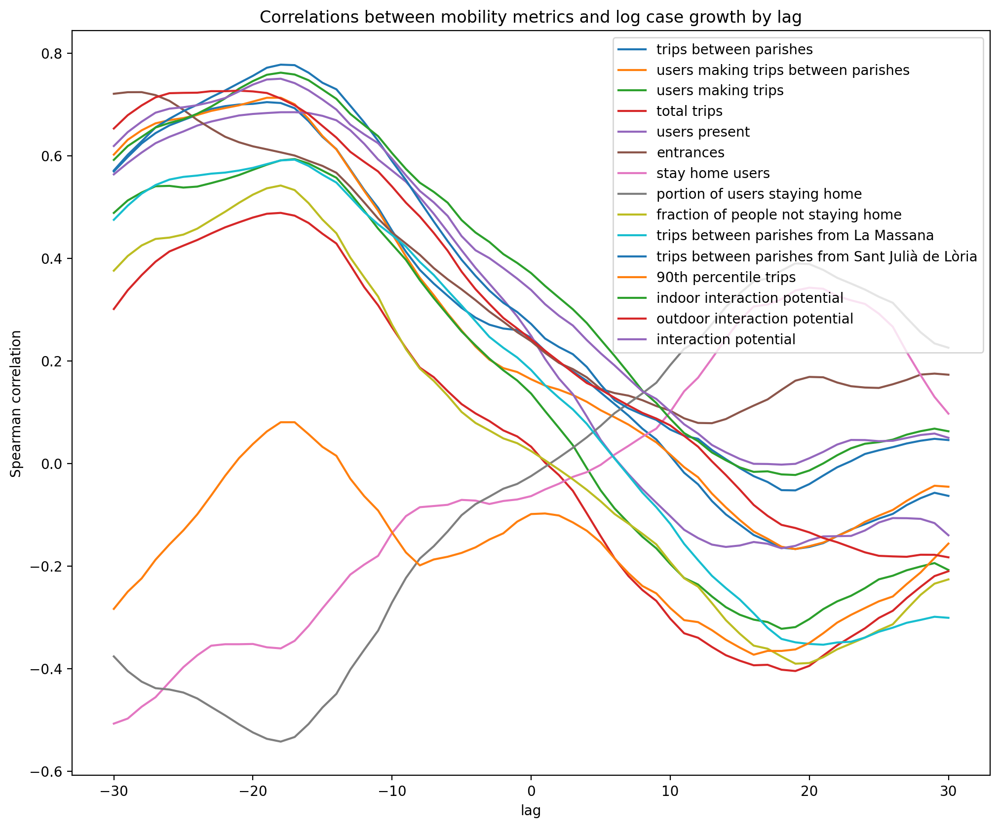

In [475]:
fig, ax= plt.subplots(1, figsize=(12, 10), dpi=100)

ax.set_title('Correlations between mobility metrics and log case growth by lag')
ax.set_ylabel('Spearman correlation')

metrics = mobility_lags_correlations_df.columns
for metric in metrics:
    mobility_lags_correlations_df[metric].plot(legend=True,ax=ax)

## Lag for maximum correlation

When is the correlation maximized for each metric?
The most important metrics are those with the highest correlation.

In [476]:
METRIC = 'metric'
MAX_CORR_VALUE = 'max correlation value over lags'
MAX_CORR_LAG = 'lag for max correlation'

max_lag_corr_records = []
for metric in mobility_metrics:
    max_lag = mobility_lags_correlations_df[metric].abs().idxmax()
    max_lag_corr_records += [{
        METRIC: metric,
        MAX_CORR_LAG: max_lag,
        MAX_CORR_VALUE: mobility_lags_correlations_df[metric].loc[max_lag],
    }]
max_lag_corr_df = pd.DataFrame.from_records(max_lag_corr_records).sort_values(MAX_CORR_VALUE, ascending=False)
max_lag_corr_df

,metric,lag for max correlation,max correlation value over lags
10,trips between parishes from Sant Julià de Lòria,-18,0.777873
12,indoor interaction potential,-18,0.762241
14,interaction potential,-18,0.750409
13,outdoor interaction potential,-21,0.727138
5,entrances,-28,0.724256
1,users making trips between parishes,-18,0.713330
0,trips between parishes,-19,0.704788
4,users present,-17,0.685160
2,users making trips,-17,0.593685
9,trips between parishes from La Massana,-17,0.592633


Lag for max correlation tends  to be -18. 

Use this value going forward for lag.

In [535]:
best_lag = -18
LAGGED_CORRELATION = 'lagged correlation value (lag=%s days)' % lag
print(LAGGED_CORRELATION)
mobility_lags_correlations_df.loc[best_lag, :].sort_values(ascending=False)

lagged correlation value (lag=30 days)


trips between parishes from Sant Julià de Lòria    0.777873
indoor interaction potential                       0.762241
interaction potential                              0.750409
users making trips between parishes                0.713330
outdoor interaction potential                      0.711809
trips between parishes                             0.703051
users present                                      0.685068
entrances                                          0.606859
users making trips                                 0.591261
trips between parishes from La Massana             0.591117
fraction of people not staying home                0.542190
total trips                                        0.488836
90th percentile trips                              0.080576
stay home users                                   -0.360467
portion of users staying home                     -0.542190
Name: -18, dtype: float64

## Compare trips between parishes and case growth correlations

In [523]:
trips_between_parishes_df.head()

,origin parish,destination parish,total trips,users
date,,,,
2020-02-01,Andorra la Vella,Canillo,2977,2885
2020-02-01,Andorra la Vella,Encamp,3914,3565
2020-02-01,Andorra la Vella,Escaldes-Engordany,21613,14527
2020-02-01,Andorra la Vella,La Massana,5506,5011
2020-02-01,Andorra la Vella,Ordino,1395,1283


In [524]:
parish_trips_lags_correlations = []

for lag in lags:
    lagged_log_case_growth = log_case_growth.shift(lag)
    lag_correlations = {LAG: lag}
    for p in parishes:

        trips_from_p = trips_between_parishes_df[
            (trips_between_parishes_df[ORIGIN_PARISH]==p)
        ][TOTAL_TRIPS].groupby(DATE).sum().reindex(study_index)
        
        smoothed_metric_series = trips_from_p.dropna().rolling(7, min_periods=1).mean().reindex(log_case_growth.index)
        rho, _pval = spearmanr(lagged_log_case_growth.values, smoothed_metric_series.values, nan_policy='omit')
        lag_correlations[p] = rho
    parish_trips_lags_correlations += [lag_correlations]

In [525]:
parish_trips_lags_correlations_df = pd.DataFrame.from_records(parish_trips_lags_correlations).set_index(LAG)
parish_trips_lags_correlations_df.head()

,Andorra la Vella,Canillo,Encamp,Escaldes-Engordany,La Massana,Ordino,Sant Julià de Lòria
lag,,,,,,,
-30,0.555418,0.572792,0.534005,0.510820,0.475300,0.510201,0.571523
-29,0.587530,0.595026,0.563860,0.542663,0.502880,0.533363,0.602035
-28,0.617184,0.613189,0.587888,0.569439,0.526302,0.546496,0.628355
-27,0.645973,0.628220,0.608325,0.591755,0.543101,0.556209,0.655507
-26,0.665496,0.639074,0.624295,0.606412,0.553798,0.554934,0.672350


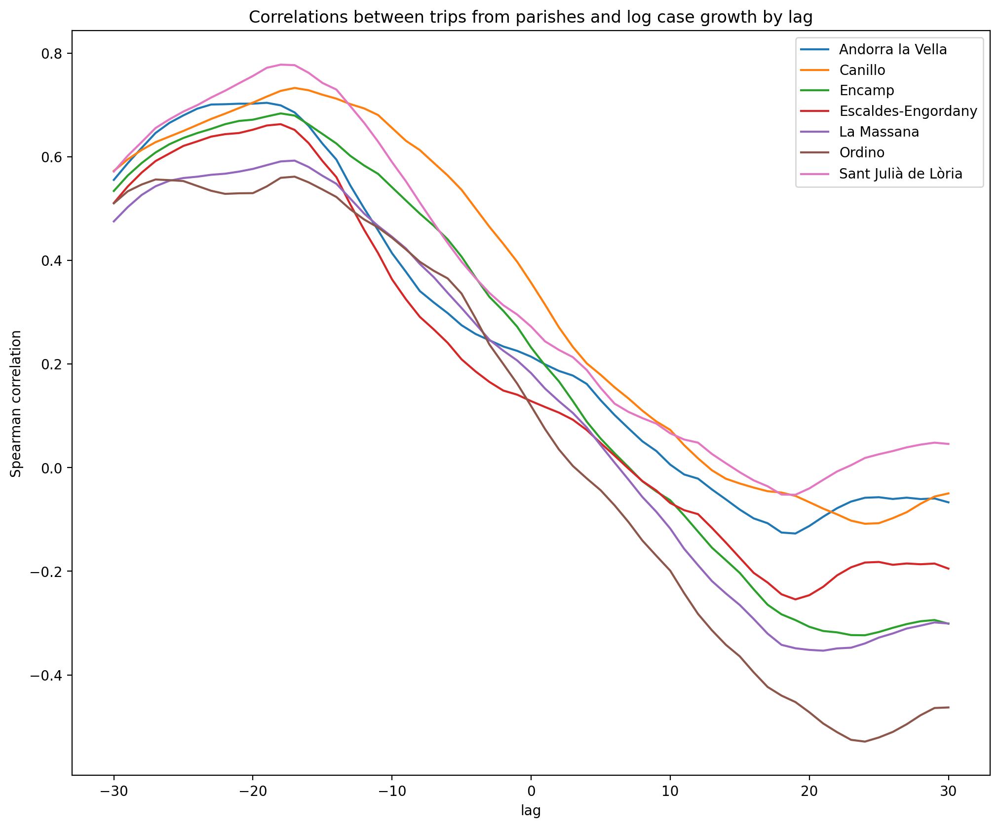

In [526]:
fig, ax= plt.subplots(1, figsize=(12, 10), dpi=100)

ax.set_title('Correlations between trips from parishes and log case growth by lag')
ax.set_ylabel('Spearman correlation')

metrics = mobility_lags_correlations_df.columns
for p in parishes:
    parish_trips_lags_correlations_df[p].plot(legend=True,ax=ax)

### Prune and plot for clearest results

(-30.0, 30.0)

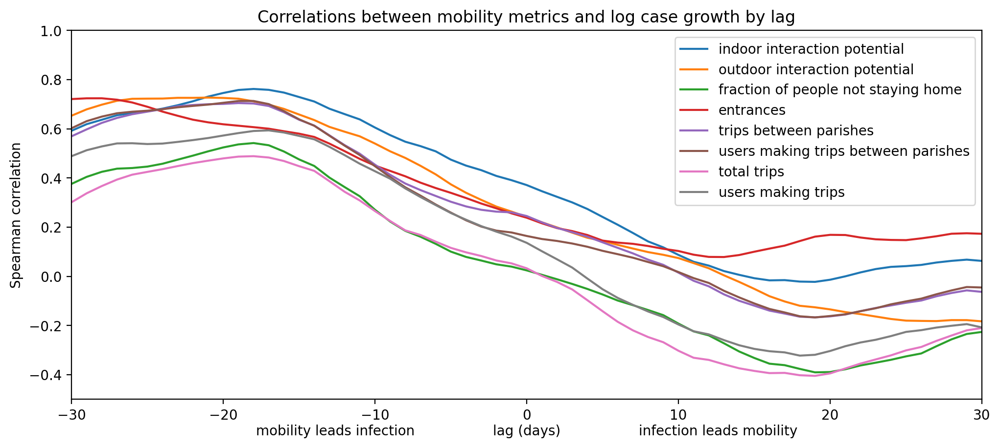

In [551]:
# choose the most relevant metrics
m_metrics = [INTERACTIONS_INDOOR, INTERACTIONS_OUTDOOR, PORTION_NOT_STAY_HOME, 
             ENTRANCES, TRIPS_BETWEEN_PARISHES, USERS_MAKING_TRIPS_BETWEEN_PARISHES,
             TOTAL_TRIPS, USERS_MAKING_TRIPS]

fig, ax= plt.subplots(1, figsize=(12, 5), dpi=100)


for metric in m_metrics:
    mobility_lags_correlations_df[metric].plot(legend=True, ax=ax)
    
ax.set_title('Correlations between mobility metrics and log case growth by lag')
ax.set_ylabel('Spearman correlation')
ax.set_xlabel('mobility leads infection                  lag (days)                  infection leads mobility', labelpad=1.5)
ax.set_ylim(-0.5,1)
ax.set_xlim(-30,30)

In [552]:
# choose the most relevant metrics

LABEL = 'label'
COLOR = 'color'
COLUMN = 'column'

a_metrics = [(
        INTERACTIONS_INDOOR,
        'indoor interaction potential',
        'tab:blue',  
    ),(
        INTERACTIONS_OUTDOOR,
        'outdoor interaction potential',
        'tab:cyan',
    ),(
        USERS_MAKING_TRIPS_BETWEEN_PARISHES,
        'number of subscribers making trips between parishes',
        'g',#'tab:purple',
    ),(
        TRIPS_BETWEEN_PARISHES,
        'number of trips between parishes',
        'y',#'tab:pink',
    )]
b_metrics = [(
        PORTION_NOT_STAY_HOME,
        'portion of subscribers not staying home',
        'tab:orange',  
    ),(
        USERS_MAKING_TRIPS,
        'number of subscribers not staying home',
        'tab:pink',
    ),(
        TOTAL_TRIPS,
        TOTAL_TRIPS,
        'tab:red',
    )]
c_metrics = [(
    ENTRANCES,
    ENTRANCES,
    'tab:brown',
)]

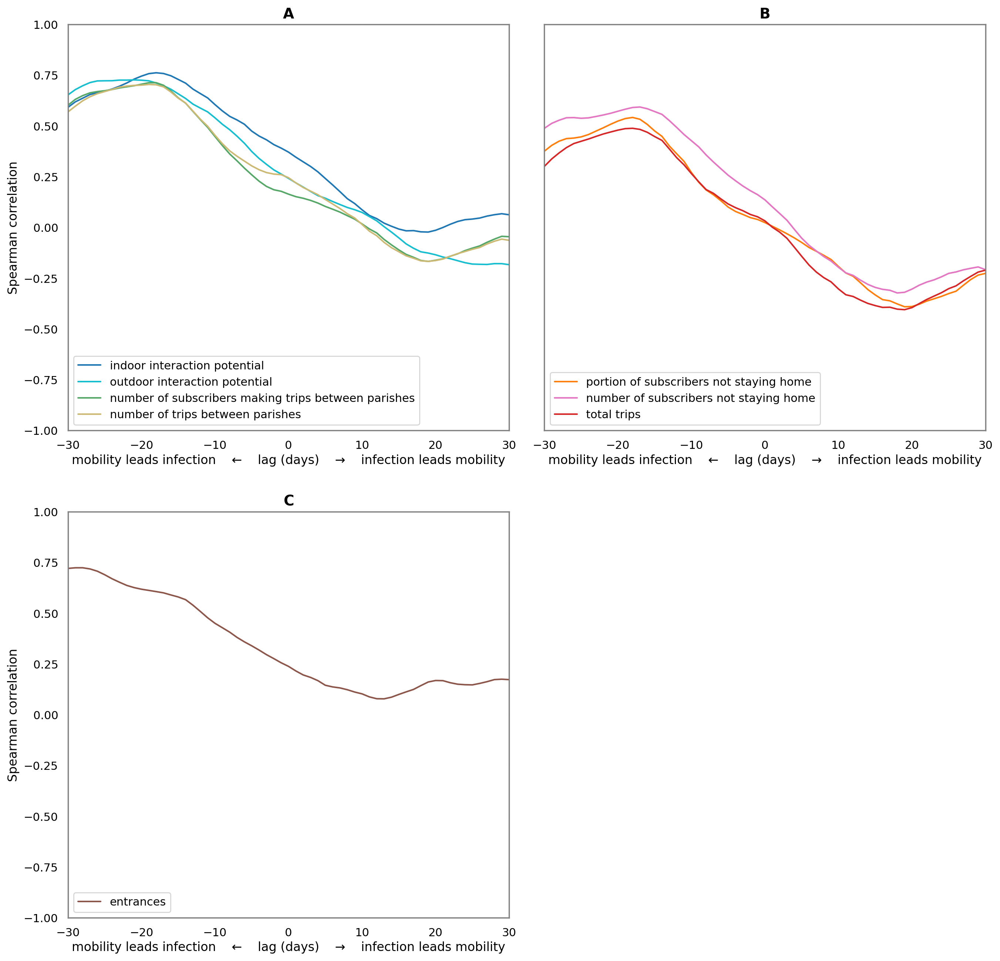

In [939]:
nrows = 2
ncols = 2
fig, axes = plt.subplots(nrows, ncols,
                         figsize=(ncols*8, nrows*8),
                         dpi=100,
                         sharey=True
                        )

[ax_a, ax_b, ax_c, ax_empty] = axes.flat
plt.subplots_adjust(hspace=0.20, wspace=0.08)

xlabel = 'mobility leads infection    ←    lag (days)    →    infection leads mobility'

for a_metric in a_metrics:
    column, label, color = a_metric
    mobility_lags_correlations_df[column].plot(
        ax=ax_a,
        legend=True,
        label=label, color=color, 
    )
    
for b_metric in b_metrics:
    column, label, color = b_metric
    mobility_lags_correlations_df[column].plot(
        ax=ax_b,
        legend=True,
        label=label, color=color, 
    )

for c_metric in c_metrics:
    column, label, color = c_metric
    mobility_lags_correlations_df[column].plot(
        ax=ax_c, 
        legend=True,
        label=label, color=color, 
    )
    
for ax, label in zip([ax_a,ax_b,ax_c], ['A','B','C']):
    ax.set_title(label, fontweight='bold',fontsize=14)
    ax.set_ylabel('Spearman correlation')
    ax.set_ylim(-1,1)
    ax.set_xlim(-30,30)
    ax.set_xlabel(xlabel, labelpad=3)
    ax.legend(loc='lower left',)
    
fig.delaxes(ax_empty)

In [940]:
metrics = a_metrics + b_metrics + c_metrics
metrics_cols = [m[0] for m in metrics]
metrics_labels = [m[1] for m in metrics]

In [671]:
import seaborn as sns

In [760]:
heatmap_df = mobility_lags_correlations_df[metrics_cols].transpose().round(2)
pd.set_option('max_columns', None)
heatmap_df

lag,-30,-29,-28,-27,-26,-25,-24,-23,-22,-21,-20,-19,-18,-17,-16,-15,-14,-13,-12,-11,-10,-9,-8,-7,-6,-5,-4,-3,-2,-1,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30
indoor interaction potential,0.59,0.62,0.64,0.66,0.66,0.67,0.68,0.70,0.71,0.73,0.75,0.76,0.76,0.76,0.75,0.73,0.71,0.68,0.66,0.64,0.61,0.57,0.55,0.53,0.51,0.47,0.45,0.43,0.41,0.39,0.37,0.35,0.32,0.30,0.27,0.24,0.21,0.18,0.14,0.12,0.09,0.06,0.04,0.02,0.01,-0.01,-0.02,-0.02,-0.02,-0.02,-0.01,0.00,0.02,0.03,0.04,0.04,0.05,0.06,0.06,0.07,0.06
outdoor interaction potential,0.65,0.68,0.70,0.71,0.72,0.72,0.72,0.73,0.73,0.73,0.73,0.72,0.71,0.70,0.68,0.66,0.64,0.61,0.59,0.57,0.54,0.51,0.48,0.45,0.41,0.37,0.34,0.31,0.28,0.26,0.24,0.22,0.20,0.18,0.16,0.14,0.13,0.11,0.10,0.09,0.07,0.05,0.03,0.00,-0.02,-0.05,-0.08,-0.10,-0.12,-0.13,-0.13,-0.15,-0.15,-0.16,-0.17,-0.18,-0.18,-0.18,-0.18,-0.18,-0.18
users making trips between parishes,0.60,0.63,0.65,0.66,0.67,0.67,0.68,0.69,0.69,0.70,0.71,0.71,0.71,0.70,0.67,0.64,0.61,0.57,0.53,0.49,0.45,0.40,0.36,0.33,0.29,0.26,0.23,0.20,0.19,0.18,0.16,0.15,0.14,0.13,0.12,0.10,0.09,0.08,0.06,0.04,0.02,-0.01,-0.03,-0.06,-0.09,-0.11,-0.13,-0.15,-0.16,-0.17,-0.16,-0.15,-0.14,-0.13,-0.11,-0.10,-0.09,-0.07,-0.06,-0.04,-0.05
trips between parishes,0.57,0.60,0.62,0.64,0.66,0.67,0.68,0.69,0.70,0.70,0.70,0.70,0.70,0.69,0.67,0.64,0.61,0.57,0.53,0.50,0.45,0.41,0.38,0.35,0.33,0.30,0.28,0.27,0.26,0.26,0.25,0.22,0.20,0.18,0.16,0.14,0.12,0.09,0.07,0.05,0.02,-0.02,-0.04,-0.07,-0.10,-0.12,-0.14,-0.15,-0.16,-0.17,-0.16,-0.16,-0.14,-0.13,-0.12,-0.11,-0.10,-0.08,-0.07,-0.06,-0.06
fraction of people not staying home,0.38,0.40,0.43,0.44,0.44,0.45,0.46,0.47,0.49,0.51,0.52,0.54,0.54,0.53,0.51,0.48,0.45,0.40,0.36,0.33,0.27,0.22,0.19,0.16,0.13,0.10,0.08,0.06,0.05,0.04,0.02,0.01,-0.01,-0.03,-0.05,-0.07,-0.10,-0.12,-0.14,-0.16,-0.19,-0.22,-0.24,-0.27,-0.31,-0.33,-0.36,-0.36,-0.38,-0.39,-0.39,-0.38,-0.36,-0.35,-0.34,-0.33,-0.31,-0.28,-0.26,-0.23,-0.23
users making trips,0.49,0.51,0.53,0.54,0.54,0.54,0.54,0.55,0.55,0.56,0.57,0.58,0.59,0.59,0.59,0.57,0.56,0.53,0.49,0.46,0.43,0.40,0.36,0.32,0.29,0.26,0.23,0.20,0.18,0.16,0.14,0.10,0.07,0.04,-0.01,-0.05,-0.09,-0.12,-0.14,-0.17,-0.20,-0.22,-0.24,-0.26,-0.28,-0.29,-0.30,-0.31,-0.32,-0.32,-0.30,-0.28,-0.27,-0.26,-0.24,-0.23,-0.22,-0.21,-0.20,-0.19,-0.21
total trips,0.30,0.34,0.37,0.39,0.41,0.42,0.44,0.45,0.46,0.47,0.48,0.49,0.49,0.48,0.47,0.45,0.43,0.39,0.34,0.31,0.27,0.23,0.19,0.17,0.14,0.12,0.10,0.08,0.06,0.05,0.03,0.00,-0.02,-0.05,-0.10,-0.14,-0.18,-0.22,-0.25,-0.27,-0.30,-0.33,-0.34,-0.36,-0.37,-0.38,-0.39,-0.39,-0.40,-0.40,-0.39,-0.37,-0.35,-0.34,-0.32,-0.30,-0.29,-0.26,-0.24,-0.22,-0.21
entrances,0.72,0.72,0.72,0.72,0.71,0.69,0.67,0.65,0.64,0.63,0.62,0.61,0.61,0.60,0.59,0.58,0.57,0.54,0.51,0.48,0.45,0.43,0.41,0.38,0.36,0.34,0.32,0.30,0.28,0.26,0.24,0.22,0.20,0.18,0.17,0.15,0.14,0.13,0.12,0.11,0.10,0.09,0.08,0.08,0.09,0.10,0.11,0.13,0.14,0.16,0.17,0.17,0.16,0.15,0.15,0.15,0.15,0.16,0.17,0.18,0.17


In [761]:
annotations_df = heatmap_df.copy()
lag_cols = annotations_df.columns
lag_cols
for lag_col in lag_cols:
    if (lag_col % 3 != 0) or (lag_col == -30) or (lag_col == 30):
        annotations_df[lag_col]  = np.NaN

Text(0.5, 636.5000000000003, 'mobility leads infection    ←      lag (days)       →    infection leads mobility')

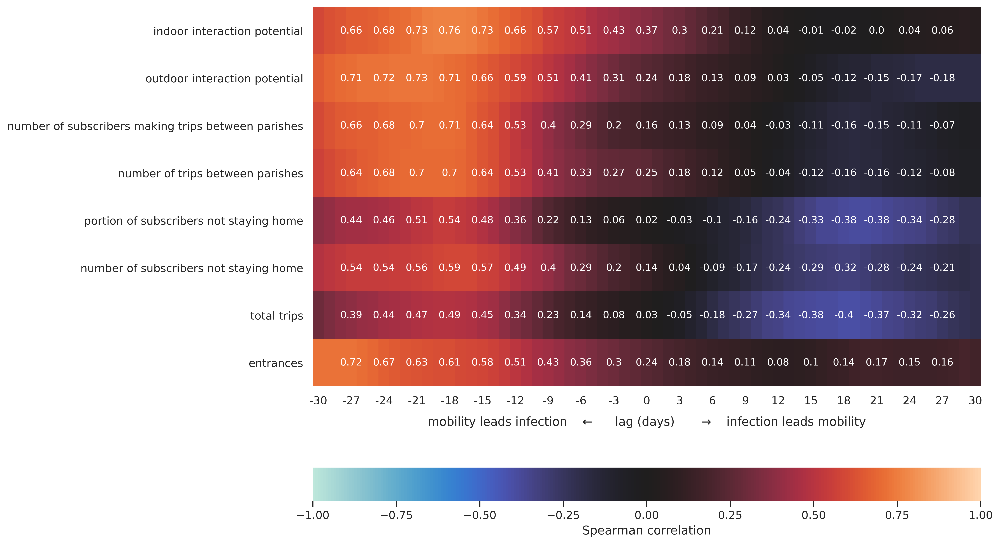

In [674]:
fig, ax = plt.subplots(figsize=(12, 10), dpi=200)

sns.heatmap(heatmap_df, ax=ax,
            center=0, vmin=-1, vmax=1, xticklabels=3, yticklabels=metrics_labels,
            annot=annotations_df.fillna('').astype(str).to_numpy(),
            fmt='',
            annot_kws={"size":10},
            cbar_kws={'label': 'Spearman correlation', "orientation": "horizontal"})
xlabel = 'mobility leads infection    ←      lag (days)       →    infection leads mobility'

ax.set_xlabel(xlabel, labelpad=10)


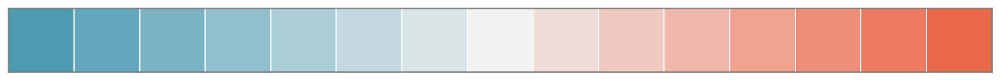

In [775]:
sns.palplot(sns.diverging_palette(220, 20, n=15))

Save  the data for someone else to make a nicer plot.

In [592]:
mobility_lcg_correlations_filepath = '../outputs/mobility_lcg_correlations.csv'

In [849]:
mobility_lags_correlations_df[metrics_cols].round(3)

,indoor interaction potential,outdoor interaction potential,users making trips between parishes,trips between parishes,fraction of people not staying home,users making trips,total trips,entrances
lag,,,,,,,,
-30,0.592,0.653,0.602,0.570,0.376,0.489,0.301,0.721
-29,0.619,0.679,0.631,0.598,0.405,0.513,0.338,0.724
-28,0.637,0.698,0.650,0.624,0.425,0.529,0.367,0.724
-27,0.655,0.714,0.663,0.644,0.438,0.541,0.394,0.718
-26,0.664,0.722,0.670,0.659,0.441,0.541,0.414,0.707
...,...,...,...,...,...,...,...,...
26,0.047,-0.181,-0.090,-0.098,-0.313,-0.219,-0.287,0.155
27,0.056,-0.182,-0.073,-0.081,-0.284,-0.208,-0.262,0.163
28,0.063,-0.178,-0.057,-0.067,-0.256,-0.201,-0.240,0.173


In [850]:
print('saving correlations data to %s'  % mobility_lcg_correlations_filepath)
mobility_lags_correlations_df[metrics_cols].round(3).to_csv(
    mobility_lcg_correlations_filepath)

saving correlations data to ../outputs/mobility_lcg_correlations.csv


In [585]:
mobility_lags_correlations_df[metrics_cols]

,indoor interaction potential,outdoor interaction potential,users making trips between parishes,trips between parishes,fraction of people not staying home,users making trips,total trips,entrances
lag,,,,,,,,
-30,0.592097,0.653318,0.602411,0.569600,0.376089,0.488746,0.301328,0.721090
-29,0.619039,0.679296,0.631257,0.597805,0.404734,0.513056,0.337896,0.724143
-28,0.637006,0.698306,0.649787,0.624270,0.425291,0.528536,0.367407,0.724256
-27,0.655222,0.714097,0.663427,0.644387,0.438029,0.540747,0.393678,0.718471
-26,0.664294,0.722180,0.669699,0.659413,0.440644,0.541484,0.413614,0.707216
...,...,...,...,...,...,...,...,...
26,0.046682,-0.181050,-0.090458,-0.098174,-0.313470,-0.218714,-0.287104,0.154621
27,0.056371,-0.181806,-0.072717,-0.080990,-0.284144,-0.208099,-0.262373,0.163166
28,0.063141,-0.177782,-0.057002,-0.067486,-0.256026,-0.200758,-0.240400,0.173436


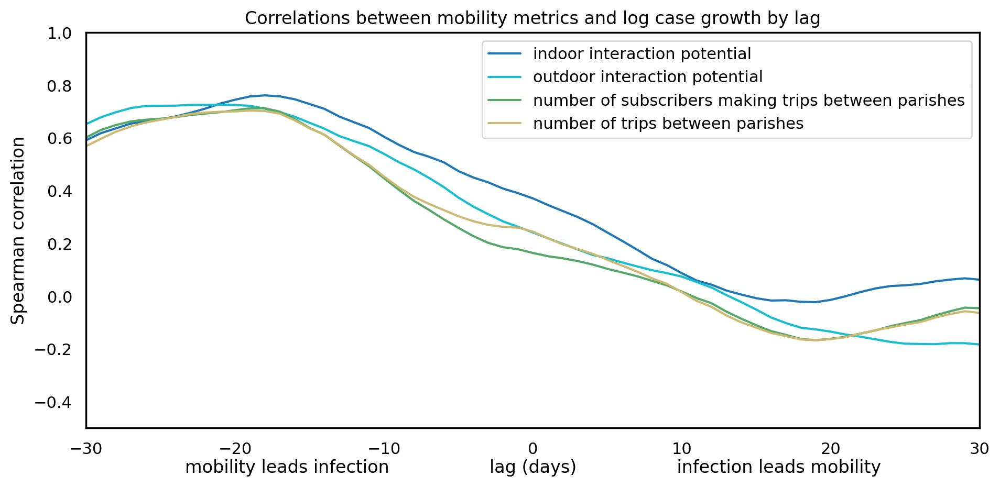

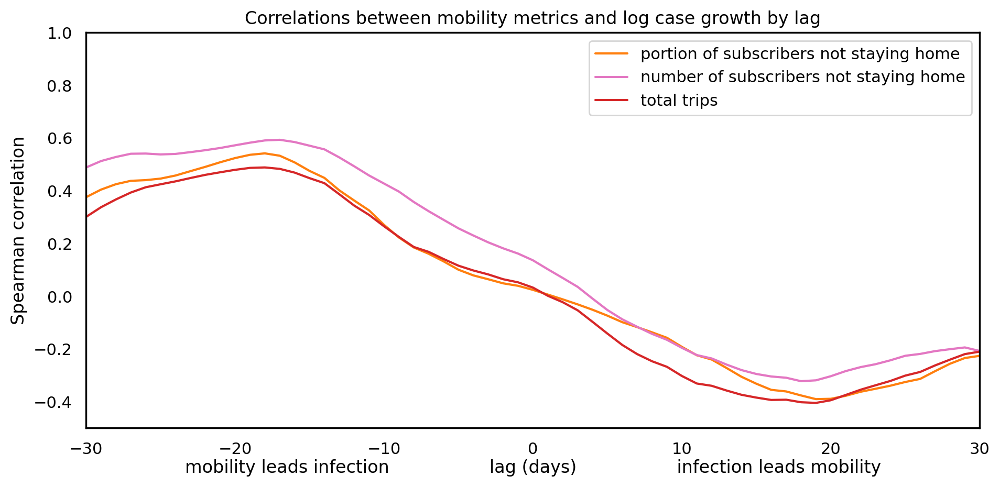

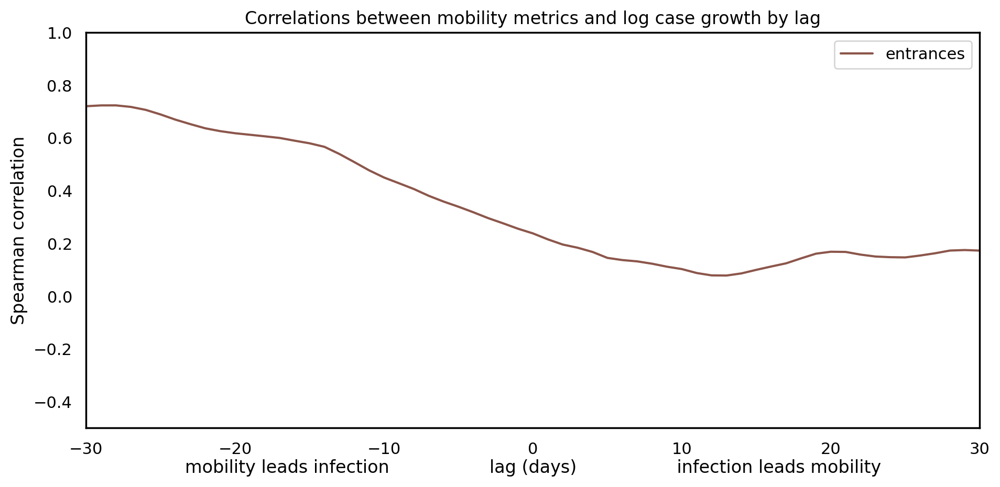

In [722]:


xlabel = 'mobility leads infection                  lag (days)                  infection leads mobility'

fig, ax_a= plt.subplots(1, figsize=(11, 5), dpi=100)
for a_metric in a_metrics:
    column, label, color = a_metric
    mobility_lags_correlations_df[column].plot(
        legend=True, ax=ax_a,
        label=label, color=color, 
    )
    
fig, ax_b = plt.subplots(1, figsize=(11, 5), dpi=100)
for b_metric in b_metrics:
    column, label, color = b_metric
    mobility_lags_correlations_df[column].plot(
        legend=True, ax=ax_b,
        label=label, color=color, 
    )

fig, ax_c = plt.subplots(1, figsize=(11, 5), dpi=100)
for c_metric in c_metrics:
    column, label, color = c_metric
    mobility_lags_correlations_df[column].plot(
        legend=True, ax=ax_c,
        label=label, color=color, 
    )
    
for ax in [ax_a,ax_b,ax_c]:
    ax.set_title('Correlations between mobility metrics and log case growth by lag')
    ax.set_ylabel('Spearman correlation')
    ax.set_ylim(-0.5,1)
    ax.set_xlim(-30,30)
    ax.set_xlabel(xlabel, labelpad=1.5)

## Plot lagged growth in cases against metrics

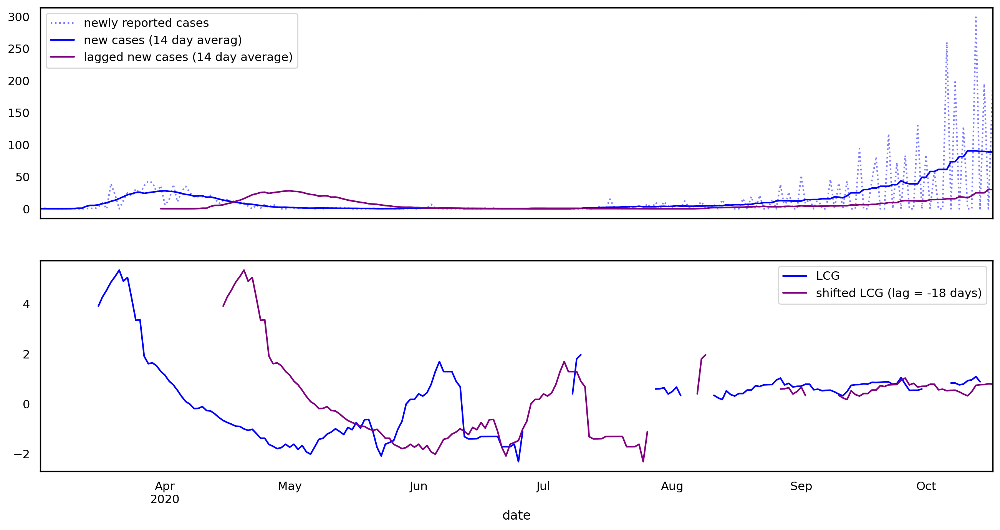

In [719]:
fig, ax= plt.subplots(2, figsize=(16, 8), dpi=100, sharex=True)
infections_color = 'blue'
lagged_infections_color = 'purple'
# plt.subplots_adjust(hspace=0.35)

new_cases_ax = ax[0]
cases[NEW_CASES].reindex(study_index).plot(
    legend=True, ax=new_cases_ax, color=infections_color, alpha=0.5, linestyle='dotted', label='newly reported cases')
cases[NEW_CASES_SMOOTHED_14D].plot(
    legend=True, ax=new_cases_ax, color=infections_color, label='new cases (14 day averag)')
cases[NEW_CASES_SMOOTHED_14D].shift(lag).plot(
    legend=True, ax=new_cases_ax, color=lagged_infections_color, label='lagged new cases (14 day average)')


cases['LCG'].reindex(study_index).plot(
    legend=True, ax=ax[1], color=infections_color)
cases['LCG'].reindex(study_index).shift(lag).plot(
    legend=True, ax=ax[1], color=lagged_infections_color, 
    label='shifted LCG (lag = -18 days)')

plt.show()

In [724]:
import matplotlib as mpl

COLOR = 'black'
def set_colors(color=COLOR):
    mpl.rcParams['text.color'] = color
    mpl.rcParams['axes.labelcolor'] = color
    mpl.rcParams['xtick.color'] = color
    mpl.rcParams['ytick.color'] = color
    # transparent background - alpha = 0
    plt.rcParams.update({
        "figure.facecolor":  (1.0, 1.0, 1.0, 0.0),
        "axes.facecolor":    (1.0, 1.0, 1.0, 0.0),
        "savefig.facecolor": (1.0, 1.0, 1.0, 0.0),
    })
    mpl.rc('axes', edgecolor='gray')
set_colors(COLOR)

In [725]:
import matplotlib.dates as mdates
myFmt = mdates.DateFormatter('%b %d')

In [828]:
lagged_infections_color = 'orange'
mobiilty_color = 'green'

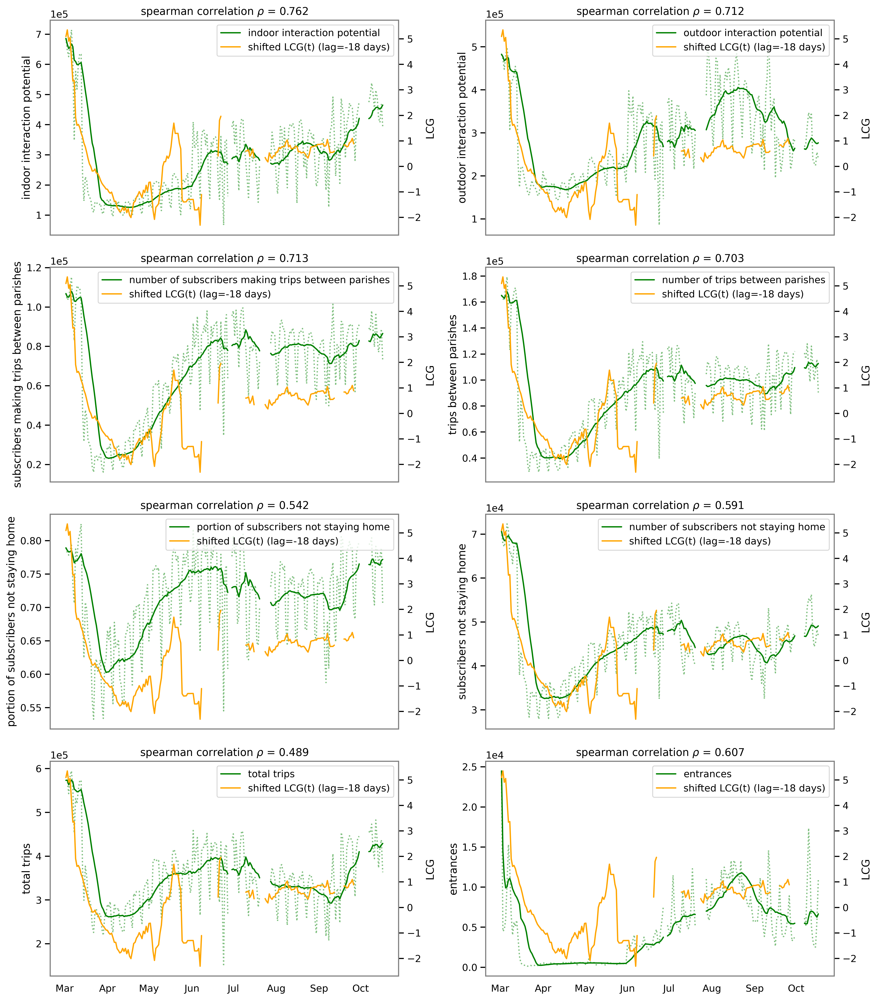

In [834]:
# plot each metric against lagged case growth, from the most correlated to the least correlated

ncols=2
nrows=int(len(metrics)/2)

fig, axes = plt.subplots(nrows, ncols, figsize=(ncols*8, nrows*5), 
                        dpi=200, 
                         sharey=False,
                         sharex=True,
                        )
plt.subplots_adjust(
                    # hspace=0.35, # for sharex=False
                    hspace=0.15,
                    # wspace=0.3, # for with/out scientitific notation
                    wspace=0.25, # with scientific notation
                   )
for i, m in enumerate(metrics):
    (column, label, _color) = m
    corr = mobility_lags_correlations_df.loc[best_lag, column]
    t = '%s vs lagged growth in COVID cases' % label
    sub_t = 'spearman correlation %s = %.3f' %  (r'$\rho$', corr)
    title = sub_t #+ t + '\n'
    m_ax = axes.flat[i]
    m_ax.set_title(title)
    lagged_case_growth_ax = m_ax.twinx()
    lns = []
    
    m_series = mobility_df[column].reindex(study_index)
    
    m_ax.plot(study_index, m_series,
        color=mobility_color, alpha=0.5, linestyle='dotted', label='__nolegend__')
    lns += m_ax.plot(study_index, m_series.dropna().rolling(14, min_periods=1).mean().reindex(study_index),
        color=mobility_color, label=label)
    
    lns += lagged_case_growth_ax.plot(cases['LCG'].reindex(study_index).shift(best_lag),
        color=lagged_infections_color, 
        label='shifted LCG(t) (lag=%s days)'%best_lag)
    labels = [l.get_label() for l in lns]
    m_ax.legend(lns, labels, loc='upper right')
    
    m_ax.xaxis.set_major_formatter(myFmt)
    m_ax.grid(False)
    lagged_case_growth_ax.grid(False)
    
    m_ax.ticklabel_format(axis='y', style='scientific', scilimits=(-3,3))
    
    m_ax.set_ylabel(label.replace('number of ', ''))
    lagged_case_growth_ax.set_ylabel('LCG')
    
    
plt.show()

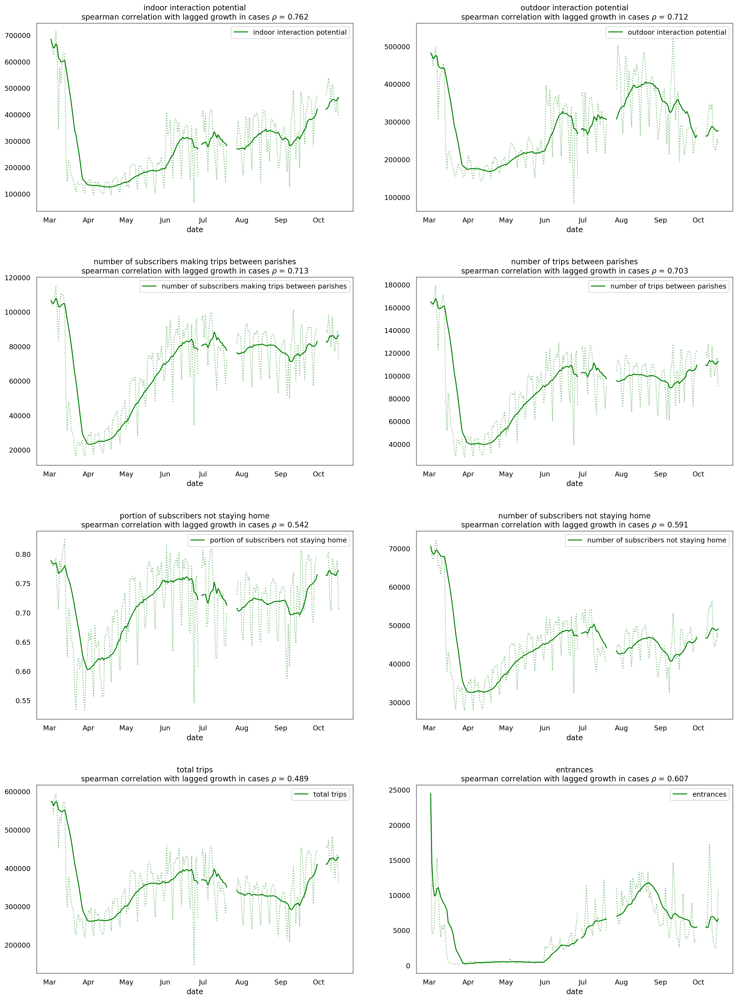

In [809]:

ncols=2
nrows=int(len(metrics)/2)

fig, axes = plt.subplots(nrows, ncols, figsize=(ncols*10, nrows*7), 
                       dpi=100, sharey=False, sharex=False)
plt.subplots_adjust(hspace=0.35)
lagged_infections_color = 'purple'
mobiilty_color = 'green'


for i, m in enumerate(metrics):
    (column, label, _color) = m
    corr = mobility_lags_correlations_df.loc[best_lag, column]
    title = ('%s\nspearman correlation with lagged growth in cases %s = %.3f' %  (label, r'$\rho$', corr))
    m_ax = axes.flat[i]
    m_ax.set_title(title)
    lns = []
    
    m_series = mobility_df[column].reindex(study_index)
    
    m_ax.plot(study_index, m_series,
        color=mobility_color, alpha=0.5, linestyle='dotted', label='__nolegend__')
    lns += m_ax.plot(study_index, m_series.dropna().rolling(14, min_periods=1).mean().reindex(study_index),
        color=mobility_color, label=label)
    labels = [l.get_label() for l in lns]
    m_ax.legend(lns, labels, loc='upper right')
    
for axis in axes.flat:
    axis.set_xlabel(DATE)
    plt.setp(axis.spines.values(), color='gray')
    axis.xaxis.set_major_formatter(myFmt)
    axis.grid(False)
plt.show()